In [1]:
import sys
# Adjust the path to point to the directory containing 'src'
sys.path.append('../')
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

from src.visualizations import plot_target_variable, plot_categorical_features, plot_numerical_features, categorical_vs_target, numerical_vs_target, plot_correlation_heatmap
from src.evaluation import plot_confusion_matrix
from src.feature_engineering import bin_age, features_engineering_extraction, encode_categorical_columns
from src.data_preprocessing import load_data, rename_columns, impute_missing_values, analyze_categorical,standardize_gender
from src.modeling import get_models
from collections import defaultdict
import warnings
warnings.filterwarnings("ignore")


In [2]:
# --- Data Loading ---
df = load_data(filepath='../data/mental-heath-in-tech-2016.csv')
print('Dataset loaded')

Data loaded successfully from: ../data/mental-heath-in-tech-2016.csv
Dataset loaded


In [3]:
df.describe()

,Are you self-employed?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?
count,1433.000000,1146.000000,263.000000,287.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.770506,0.942966,0.644599,0.882066,0.585485,34.286113
std,0.400349,0.420691,0.232350,0.479471,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,323.000000


In [4]:
df.describe(include='all')

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",...,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your age?,What is your gender?,What country do you live in?,What US state or territory do you live in?,What country do you work in?,What US state or territory do you work in?,Which of the following best describes your work position?,Do you work remotely?
count,1433.000000,1146,1146.000000,263.000000,1146,1013,1146,1146,1146,1146,...,1433,1433,1433.000000,1430,1433,840,1433,851,1433,1433
unique,NaN,6,NaN,NaN,4,3,3,3,3,6,...,5,5,NaN,70,53,47,53,48,264,3
top,NaN,26-100,NaN,NaN,Yes,No,No,No,I don't know,Somewhat easy,...,Not applicable to me,Often,NaN,Male,United States of America,California,United States of America,California,Back-end Developer,Sometimes
freq,NaN,292,NaN,NaN,531,354,813,531,742,281,...,557,538,NaN,610,840,130,851,141,263,757
mean,0.200279,NaN,0.770506,0.942966,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,34.286113,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,0.400349,NaN,0.420691,0.232350,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.290931,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.000000,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,28.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.000000,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,33.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,0.000000,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,39.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.shape

(1433, 63)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 63 columns):
 #   Column                                                                                                                                                                            Non-Null Count  Dtype  
---  ------                                                                                                                                                                            --------------  -----  
 0   Are you self-employed?                                                                                                                                                            1433 non-null   int64  
 1   How many employees does your company or organization have?                                                                                                                        1146 non-null   object 
 2   Is your employer primarily a tech company/organization?     

In [7]:

# --- Data Preprocessing ---
print("\n--- Data Preprocessing ---")

column_new_name = ["SelfEmployed", "EmployeeCount", "TechCompany", "TechRole", "EmployerMHBenefits",
                   "MHBenefitsAwareness", "EmployerMHDiscussion", "EmployerMHResources", "EmployerMHAnonymity",
                   "MHLeaveDifficulty", "MHDiscussionEmployerNegative", "PhysicalDiscussionEmployerNegative",
                   "MHDiscussionCoworkerComfort", "MHDiscussionSupervisorComfort", "EmployerMHVsPhysical",
                   "MHNegativeObserved", "PersonalnsuranceMHCoverage", "MHResourceAwareness", "MHDisclosureClients",
                   "MHDisclosureClientsNegative", "MHDisclosureCoworkers", "MHDisclosureCoworkersNegative",
                   "MHProductivityImpact", "MHProductivityPercent", "PreviousEmployers",
                   "PreviousEmployerMHBenefits", "PreviousEmployerMHBenefitsAwareness",
                   "PreviousEmployerMHDiscussion", "PreviousEmployerMHResources", "PreviousEmployerMHAnonymity",
                   "PreviousEmployerMHDiscussionNegative", "PreviousEmployerPhysicalDiscussionNegative",
                   "PreviousMHDiscussionCoworkerComfort", "PreviousMHDiscussionSupervisorComfort",
                   "PreviousEmployerMHVsPhysical", "PreviousMHNegativeObserved", "PhysicalInterviewDisclosure",
                   "PhysicalInterviewDisclosureReason", "MHInterviewDisclosure", "MHInterviewDisclosureReason",
                   "MHCareerImpact", "MHStigmaCoworker", "MHDisclosureFamilyFriends", "MHUnsupportiveResponse",
                   "MHDisclosureInfluenced", "FamilyMHHistory", "PastMHDisorder", "CurrentMHDisorder",
                   "CurrentMHDisorderConditions", "MHSelfDiagnosis", "ProfessionalMHDiagnosis",
                   "ProfessionalMHDiagnosisDetails", "MHTreatmentSought", "MHTreatmentEffectiveWorkImpact",
                   "MHTreatmentIneffectiveWorkImpact", "Age", "Gender", "CountryLive", "StateLive", "CountryWork",
                   "StateWork", "WorkPosition", "RemoteWork"]



--- Data Preprocessing ---


In [8]:

# Renaming columns
df_rename = rename_columns(df=df, renamed_columns=column_new_name)

# df.rename(columns=dict(zip(columns, renamed_columns)), inplace=True)
print("Columns renamed.")

Columns renamed.


In [9]:
# Feature engineering
print("\n--- Feature Engineering ---")

# Binning age
df_bin = bin_age(df=df_rename)



--- Feature Engineering ---
Age feature binned.


In [10]:

# Gender Feature Standardizationa

analyze_categorical(df=df_bin)

df_gender_cleaned = standardize_gender(df=df_bin)



Column 'CountryLive' has 53 unique values: ['United Kingdom' 'United States of America' 'Canada' 'Germany'
 'Netherlands' 'Czech Republic' 'Lithuania' 'Australia' 'France'
 'Venezuela' 'Poland' 'Belgium' 'Brazil' 'Denmark' 'Sweden' 'Russia'
 'Spain' 'India' 'Mexico' 'Switzerland' 'Norway' 'Argentina' 'Ireland'
 'Italy' 'Finland' 'Colombia' 'Costa Rica' 'Vietnam' 'Bulgaria'
 'New Zealand' 'South Africa' 'Slovakia' 'Austria' 'Bangladesh' 'Algeria'
 'Pakistan' 'Afghanistan' 'Greece' 'Romania' 'Other' 'Brunei' 'Japan'
 'Iran' 'Hungary' 'Israel' 'Ecuador' 'Bosnia and Herzegovina' 'China'
 'Chile' 'Guatemala' 'Taiwan' 'Serbia' 'Estonia']
Column 'CountryWork' has 53 unique values: ['United Kingdom' 'United States of America' 'Canada' 'Germany'
 'Netherlands' 'Czech Republic' 'Lithuania' 'Australia' 'France'
 'Venezuela' 'Poland' 'Belgium' 'Brazil' 'Denmark' 'Sweden' 'Russia'
 'Spain' 'India' 'United Arab Emirates' 'Mexico' 'Switzerland' 'Norway'
 'Argentina' 'Ireland' 'Italy' 'Finland' 'Turke

In [11]:
print(f'Gender features cleaned unique values: {df_gender_cleaned.Gender.unique()}')


Gender features cleaned unique values: ['Male' 'Female' 'Others' nan]


In [12]:

# More Feature Engineering
df_feature_eng = features_engineering_extraction(df=df_gender_cleaned)

print("Employment features engineered.")


Employment features engineered.


In [13]:
df_feature_eng.head()

,Age,Age_group,CountryLive,CountryWork,CurrentMHDisorder,CurrentMHDisorderConditions,EmployeeCount,EmployerMHAnonymity,EmployerMHBenefits,EmployerMHDiscussion,...,StateLive,StateWork,TechCompany,TechRole,WorkPosition,CurrentMHDisorderConditions_count,MHSelfDiagnosisConditions_count,MHPHDiagnosisConditions_count,role_count,EmploymentCompanySize
0,39,30-39,United Kingdom,United Kingdom,No,NaN,26-100,I don't know,Not eligible for coverage / N/A,No,...,NaN,NaN,1.0,NaN,Back-end Developer,0,0,1,1,Tech Employee Medium Company
1,29,18-29,United States of America,United States of America,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",2-25,Yes,No,Yes,...,Illinois,Illinois,1.0,NaN,Back-end Developer|Front-end Developer,2,0,2,2,Tech Employee Small Company
2,38,30-39,United Kingdom,United Kingdom,No,NaN,2-25,I don't know,No,No,...,NaN,NaN,1.0,NaN,Back-end Developer,0,0,0,1,Tech Employee Small Company
3,43,40-49,United Kingdom,United Kingdom,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Supervisor/Team Lead,2,0,2,1,NaN
4,43,40-49,United States of America,United States of America,Yes,"Anxiety Disorder (Generalized, Social, Phobia,...",2-25,No,Yes,No,...,Illinois,Illinois,0.0,1.0,Executive Leadership|Supervisor/Team Lead|Dev ...,2,0,1,7,Tech-Role


In [14]:
len(df_feature_eng.columns.to_list())

69

In [15]:

# Dropping Unnecessary Columns
dropped_cols = ['Age', 'CurrentMHDisorderConditions', 'EmployeeCount', 'MHInterviewDisclosureReason',
                'MHResourceAwareness', 'MHProductivityImpact', 'MHProductivityPercent',
                'MHSelfDiagnosis', 'PersonalnsuranceMHCoverage', 
                'PhysicalInterviewDisclosureReason',
                'PreviousEmployerMHAnonymity', 'PreviousEmployerMHBenefits',
                'PreviousEmployerMHBenefitsAwareness', 'PreviousEmployerMHDiscussion',
                'PreviousEmployerMHDiscussionNegative', 'PreviousEmployerMHResources',
                'PreviousEmployerMHVsPhysical', 'PreviousEmployerPhysicalDiscussionNegative',
                'PreviousEmployers', 'PreviousMHDiscussionCoworkerComfort',
                'PreviousMHDiscussionSupervisorComfort']
df_feature_eng = df_feature_eng.drop(columns=dropped_cols, errors='ignore')
print("Unnecessary columns dropped.")

Unnecessary columns dropped.


In [16]:
len(df_feature_eng.columns.to_list())

48

In [17]:
df_feature_eng.isna().sum()

Age_group                                3
CountryLive                              0
CountryWork                              0
CurrentMHDisorder                        0
EmployerMHAnonymity                    287
EmployerMHBenefits                     287
EmployerMHDiscussion                   287
EmployerMHResources                    287
EmployerMHVsPhysical                   287
FamilyMHHistory                          0
Gender                                   3
MHBenefitsAwareness                    420
MHCareerImpact                           0
MHDisclosureClients                   1146
MHDisclosureClientsNegative           1289
MHDisclosureCoworkers                 1146
MHDisclosureCoworkersNegative         1146
MHDisclosureFamilyFriends                0
MHDisclosureInfluenced                 776
MHDiscussionCoworkerComfort            287
MHDiscussionEmployerNegative           287
MHDiscussionSupervisorComfort          287
MHInterviewDisclosure                    0
MHLeaveDiff

In [18]:
# Missing values imputation
# df_cleaned = impute_missing_values(df_feature_eng)
df_cleaned = df_feature_eng.copy()
print("Missing values imputed.")

Missing values imputed.


In [19]:
df_cleaned.columns.to_list()

['Age_group',
 'CountryLive',
 'CountryWork',
 'CurrentMHDisorder',
 'EmployerMHAnonymity',
 'EmployerMHBenefits',
 'EmployerMHDiscussion',
 'EmployerMHResources',
 'EmployerMHVsPhysical',
 'FamilyMHHistory',
 'Gender',
 'MHBenefitsAwareness',
 'MHCareerImpact',
 'MHDisclosureClients',
 'MHDisclosureClientsNegative',
 'MHDisclosureCoworkers',
 'MHDisclosureCoworkersNegative',
 'MHDisclosureFamilyFriends',
 'MHDisclosureInfluenced',
 'MHDiscussionCoworkerComfort',
 'MHDiscussionEmployerNegative',
 'MHDiscussionSupervisorComfort',
 'MHInterviewDisclosure',
 'MHLeaveDifficulty',
 'MHNegativeObserved',
 'MHStigmaCoworker',
 'MHTreatmentEffectiveWorkImpact',
 'MHTreatmentIneffectiveWorkImpact',
 'MHTreatmentSought',
 'MHUnsupportiveResponse',
 'PastMHDisorder',
 'PhysicalDiscussionEmployerNegative',
 'PhysicalInterviewDisclosure',
 'PreviousMHNegativeObserved',
 'ProfessionalMHDiagnosis',
 'ProfessionalMHDiagnosisDetails',
 'RemoteWork',
 'SelfEmployed',
 'StateLive',
 'StateWork',
 'TechCo

In [20]:
# --- Exploratory Data Analysis ---
print("\n--- Exploratory Data Analysis started ---")



--- Exploratory Data Analysis started ---


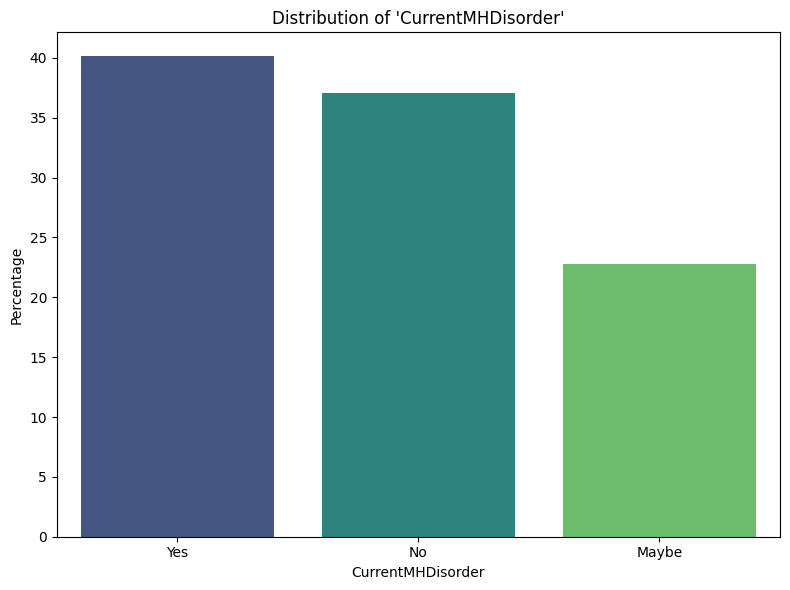

In [21]:

plot_target_variable(df_cleaned)

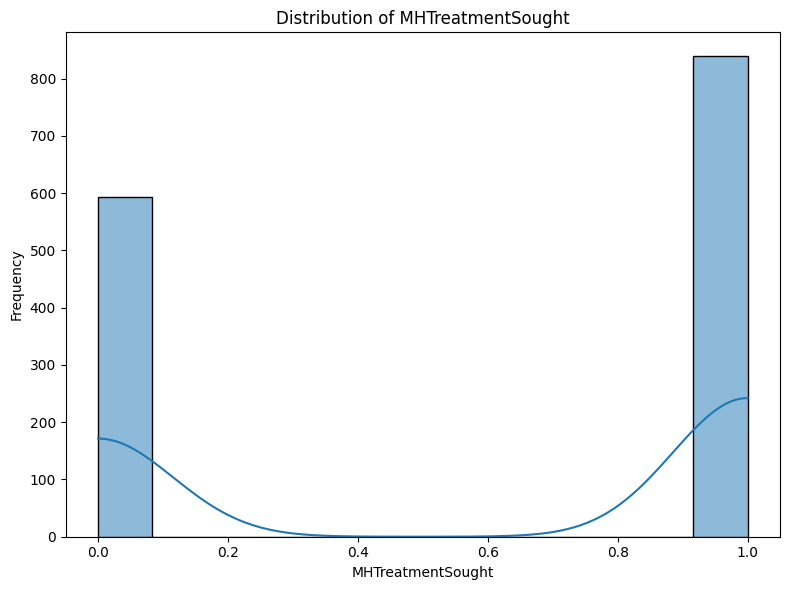

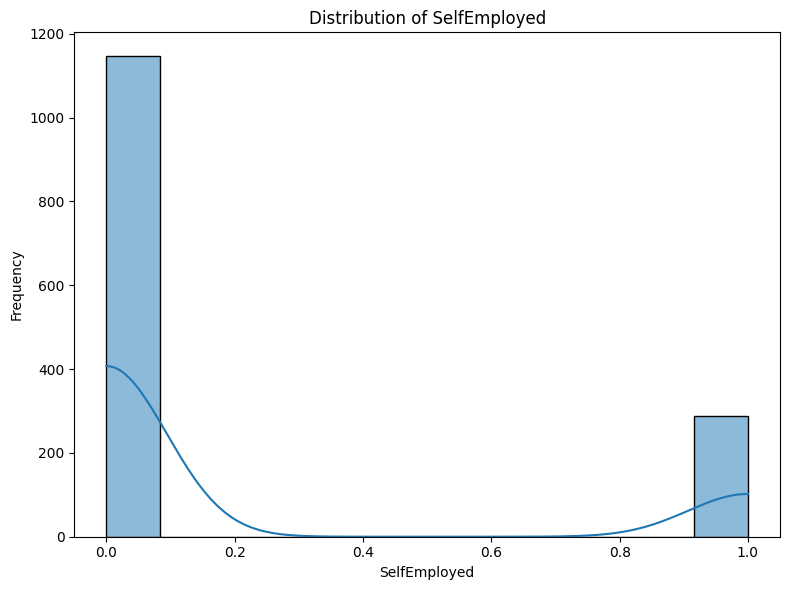

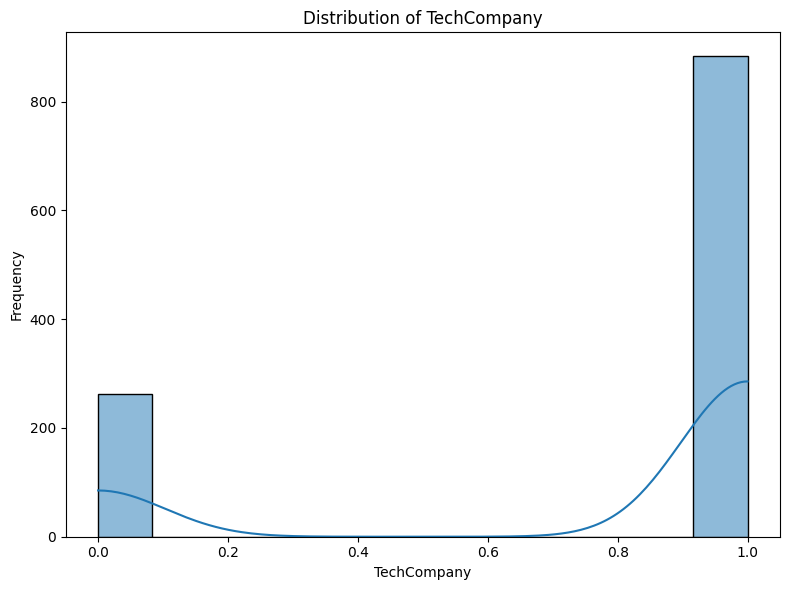

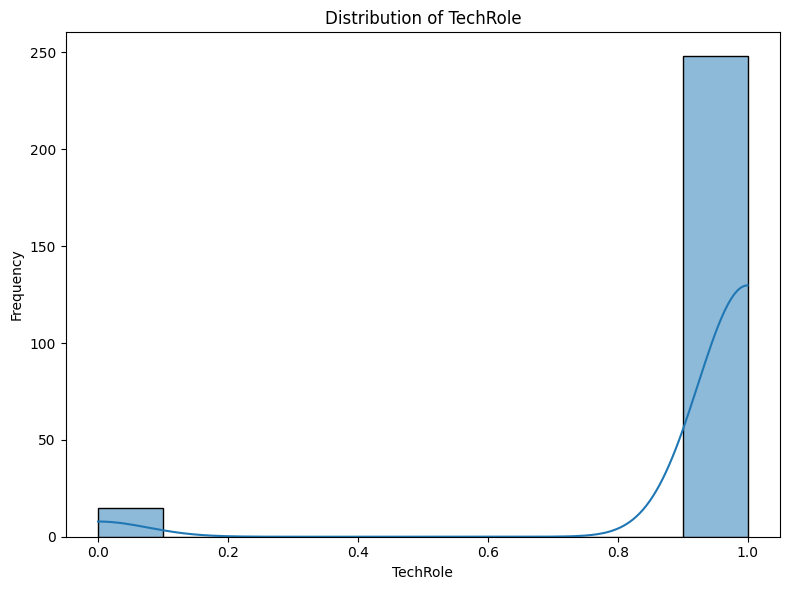

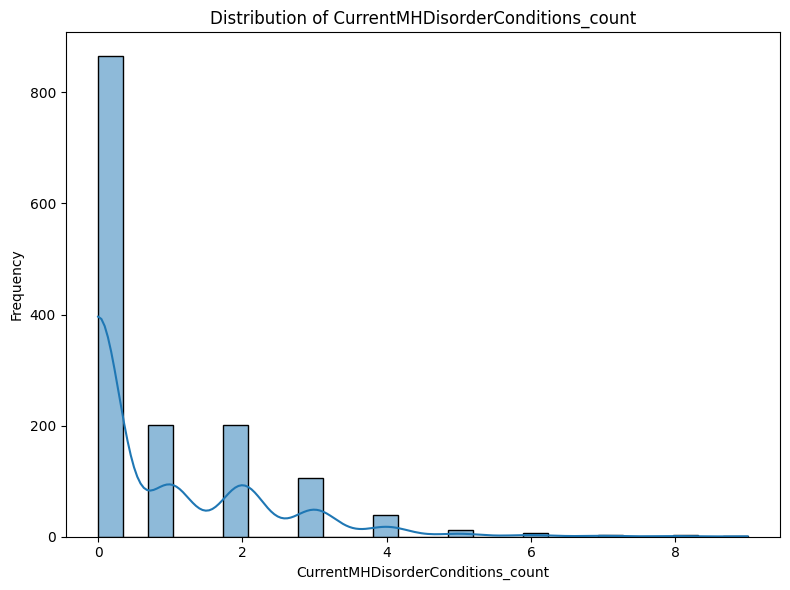

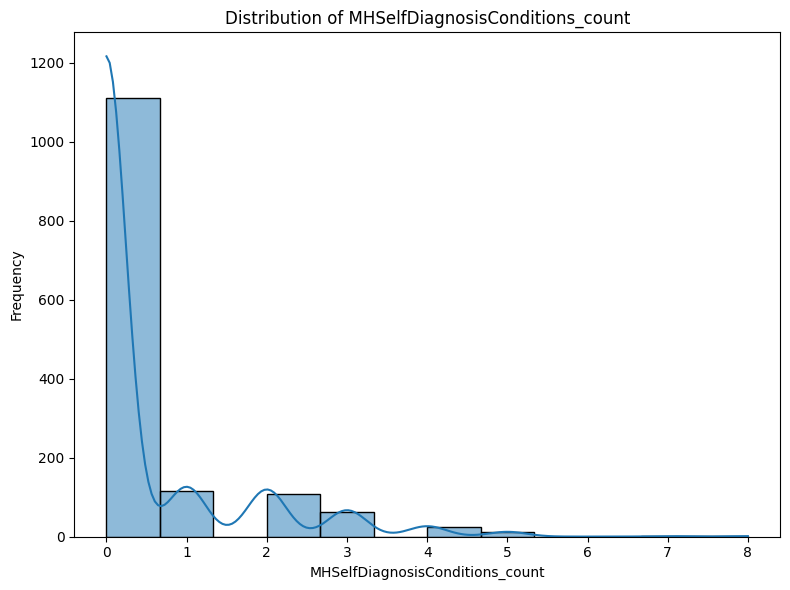

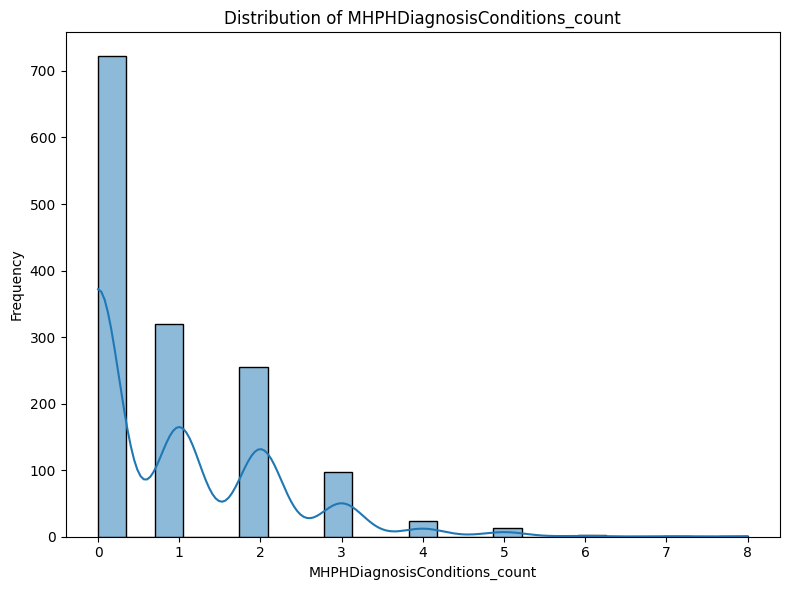

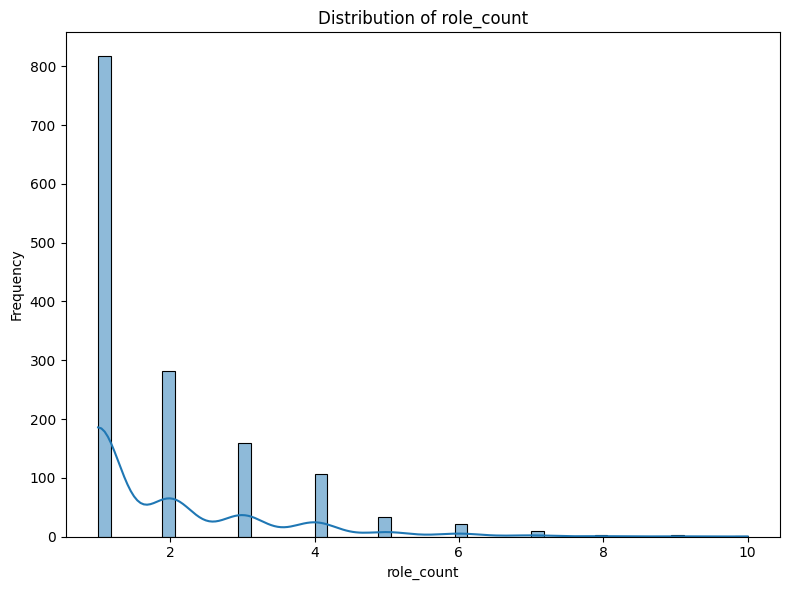

In [22]:
plot_numerical_features(df_cleaned)


In [23]:
categorical_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns.tolist()
exclude_cols = ['CountryLive', 'CountryWork', 'StateLive', 'StateWork','ProfessionMHDiagnosisDetails',]
categorical_cols = [col for col in categorical_cols if col not in exclude_cols]

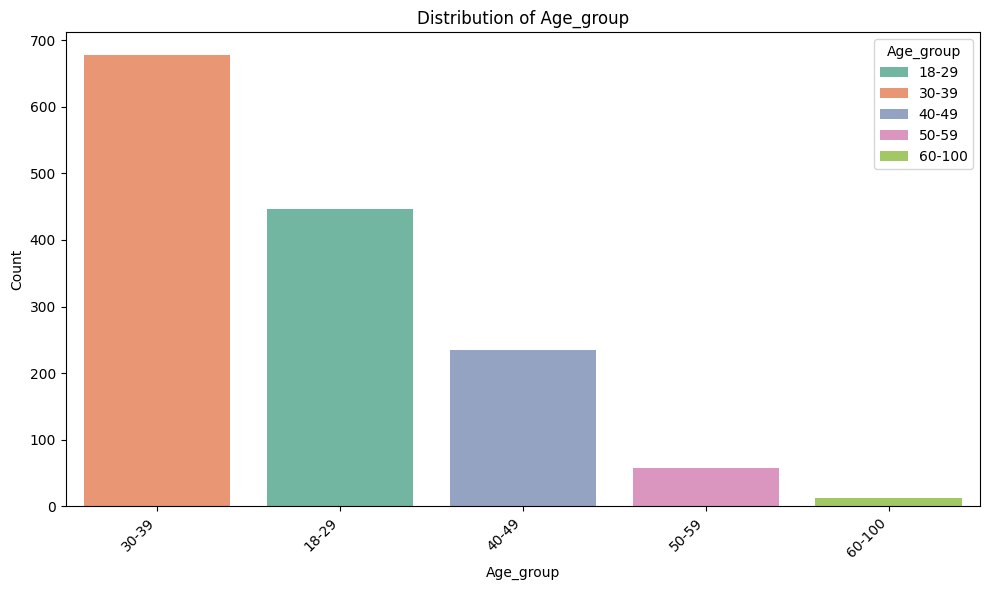

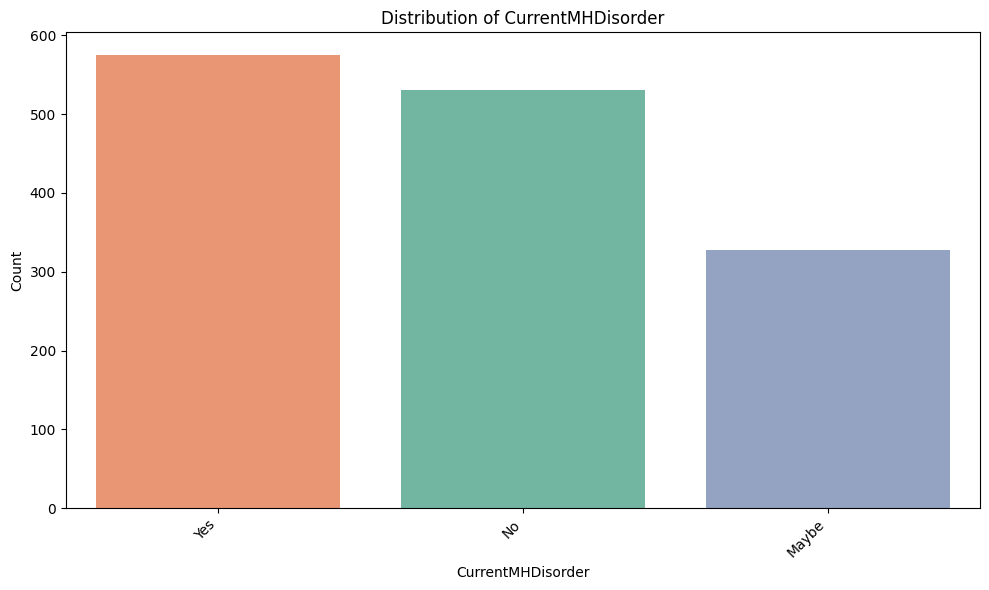

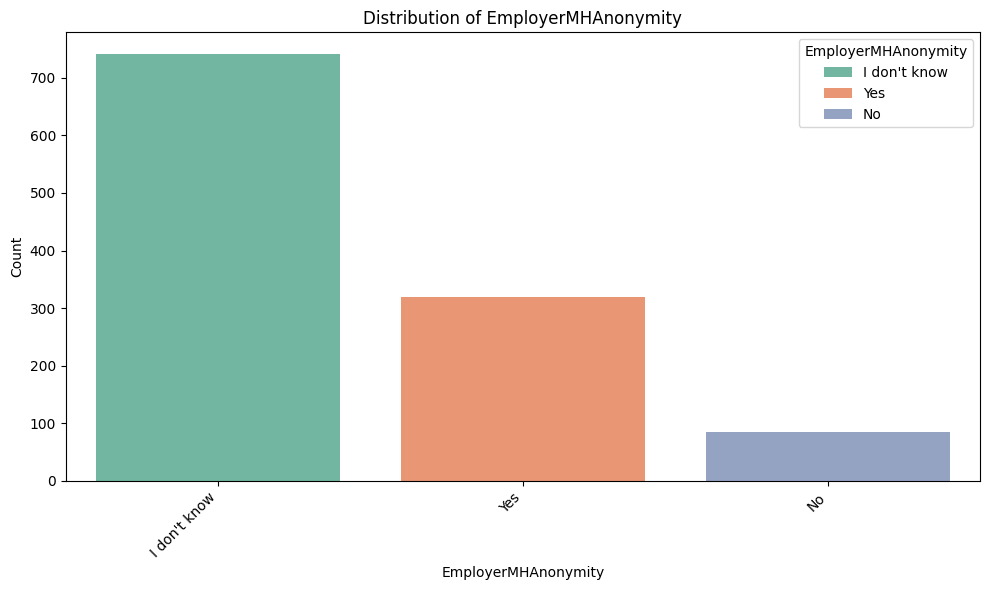

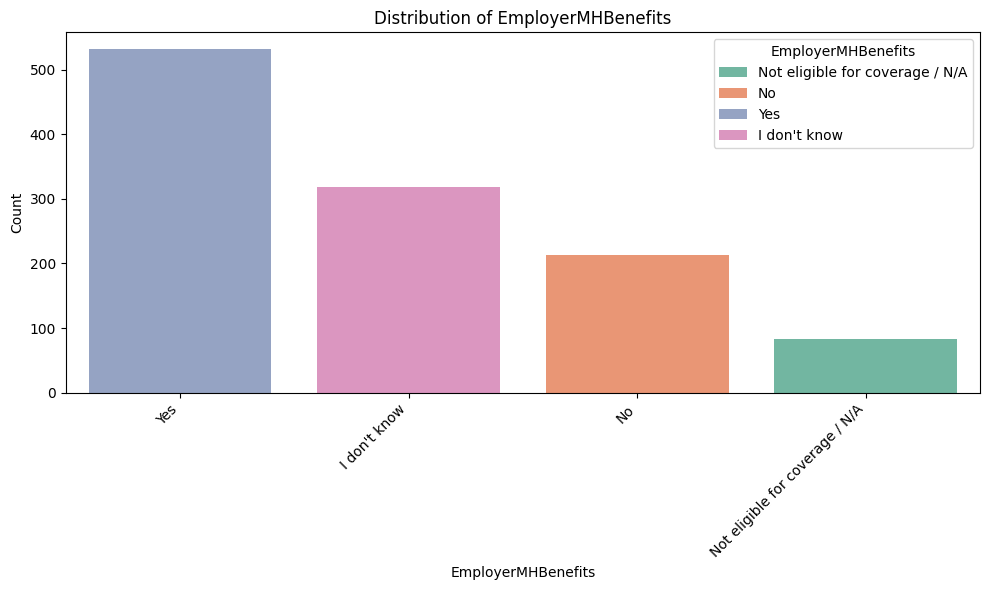

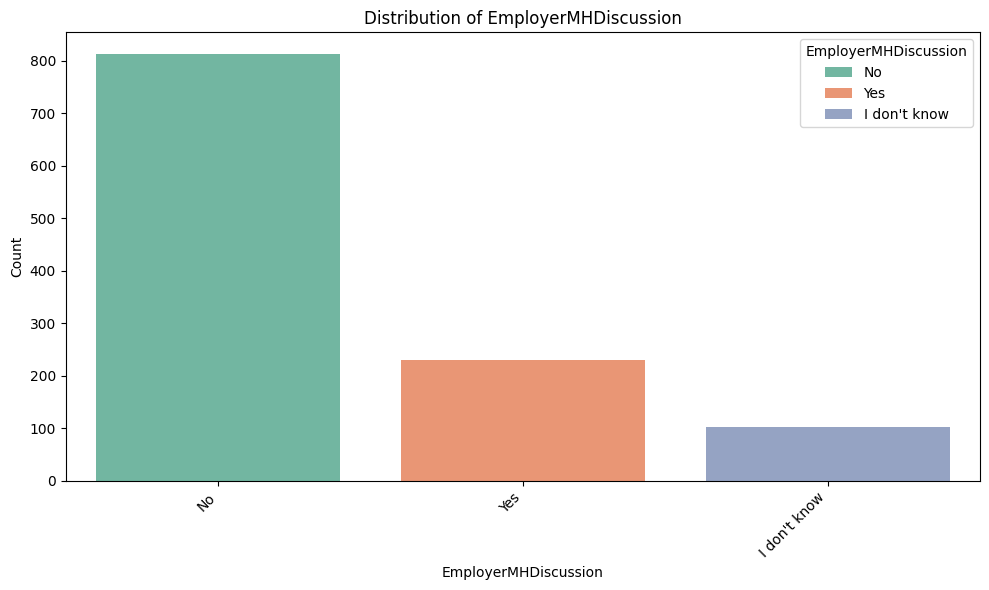

...

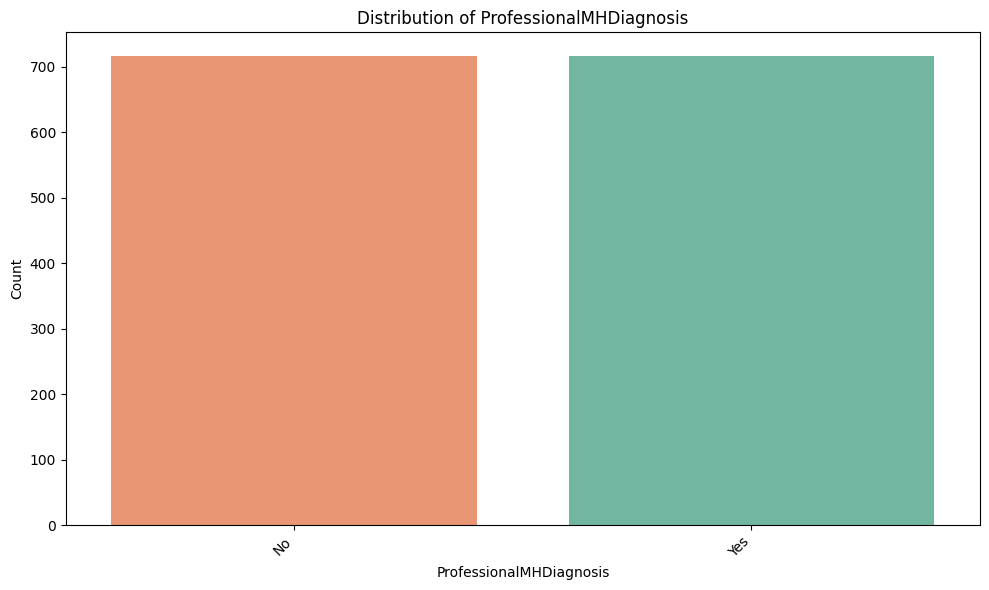

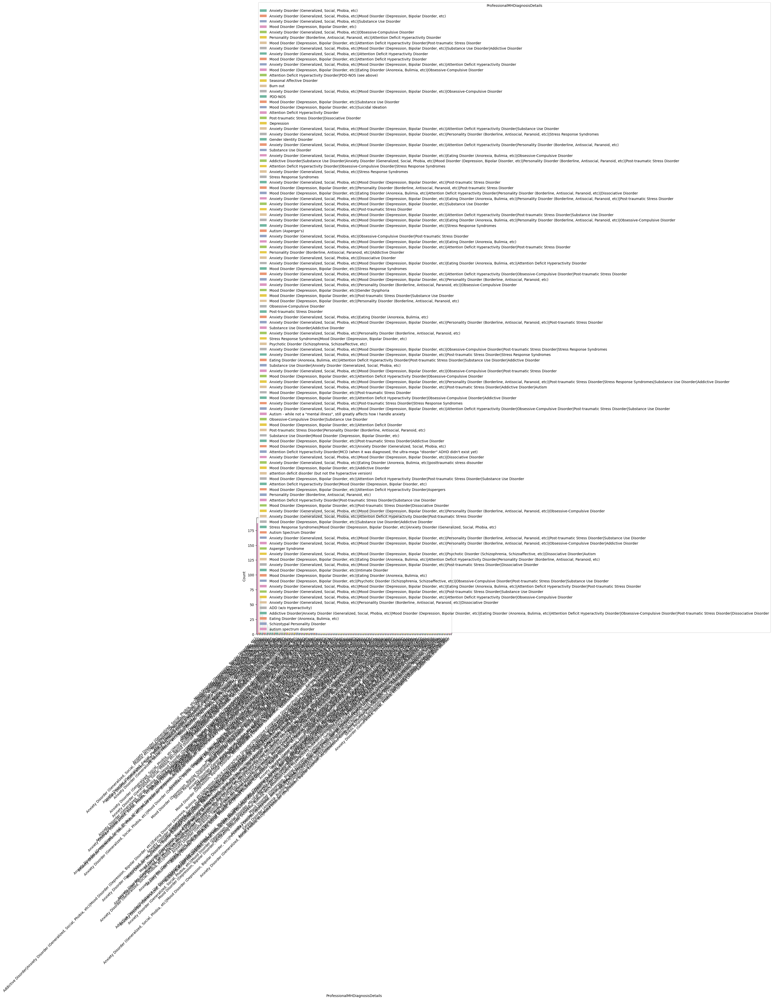

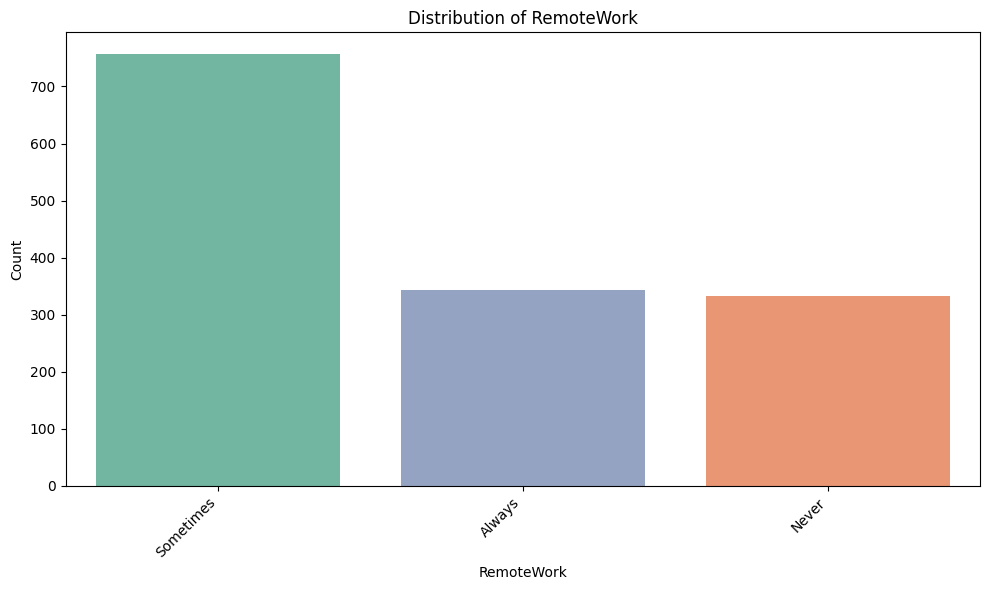

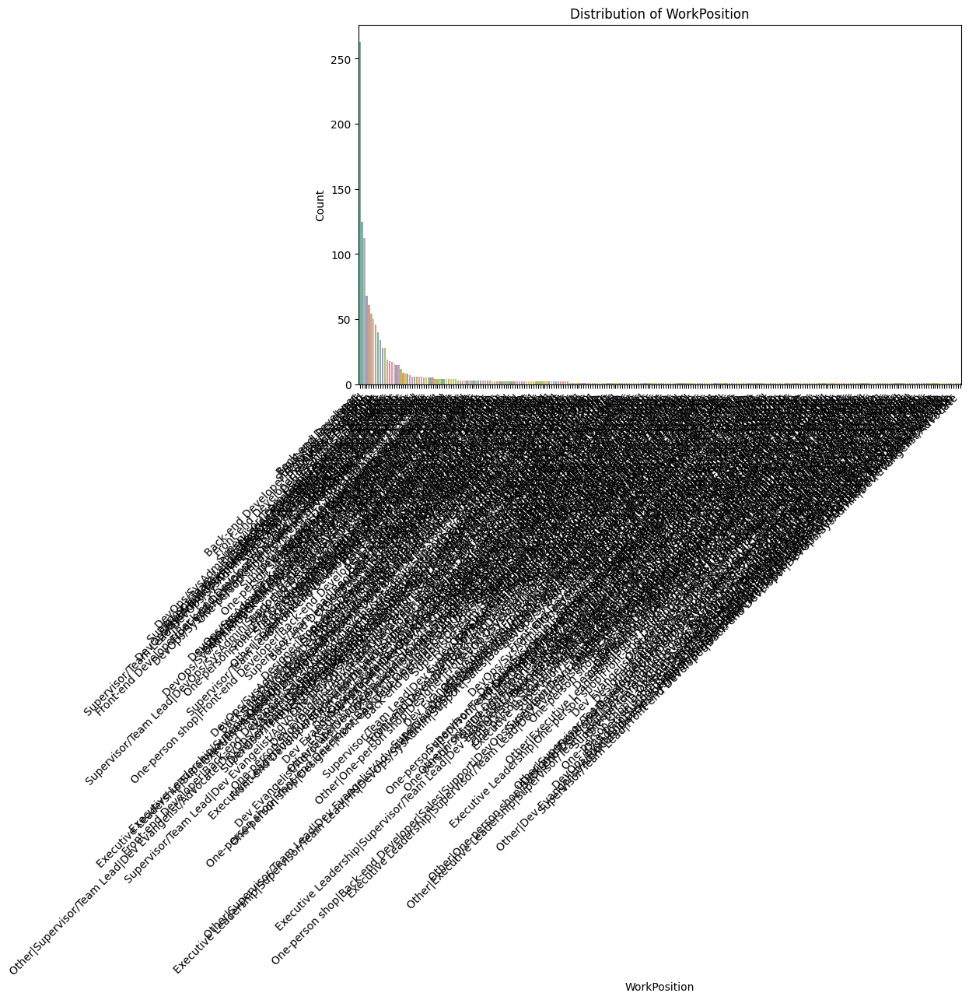

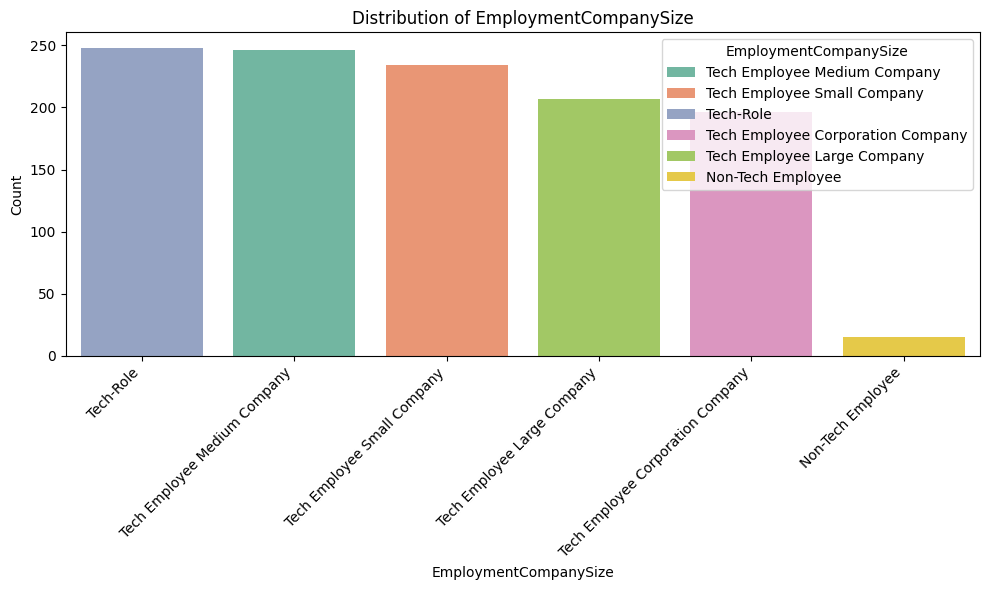

In [24]:
plot_categorical_features(df_cleaned, categorical_cols=categorical_cols)

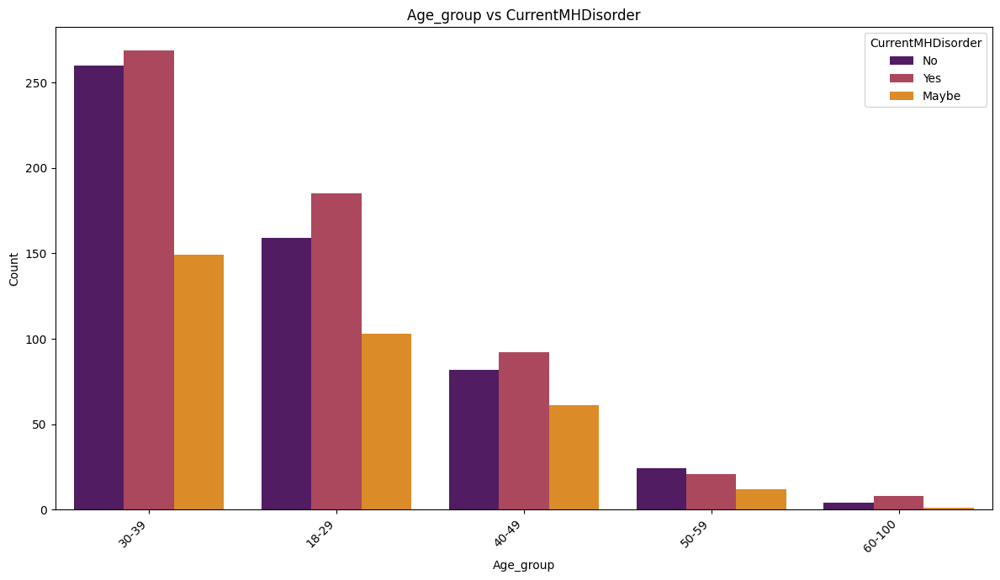

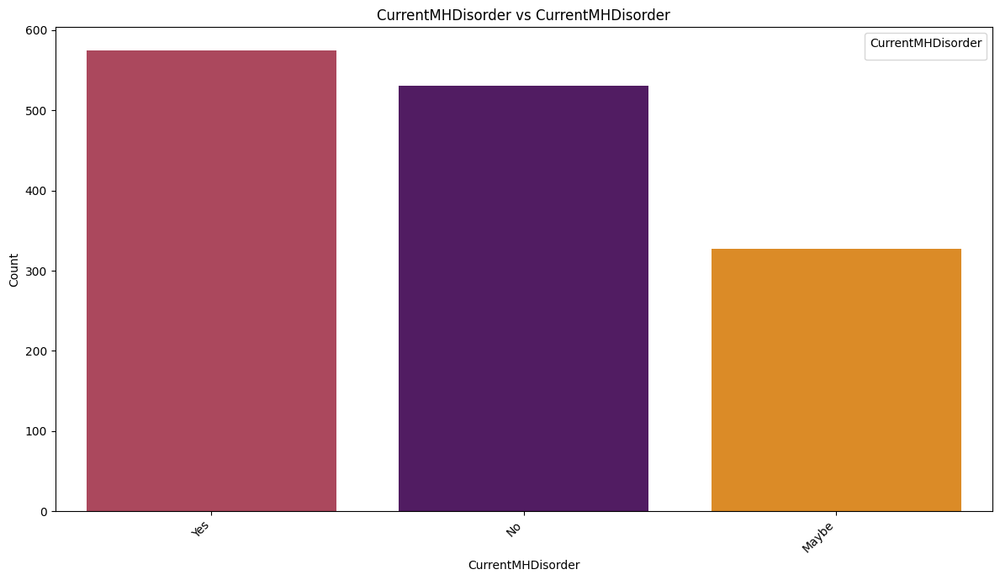

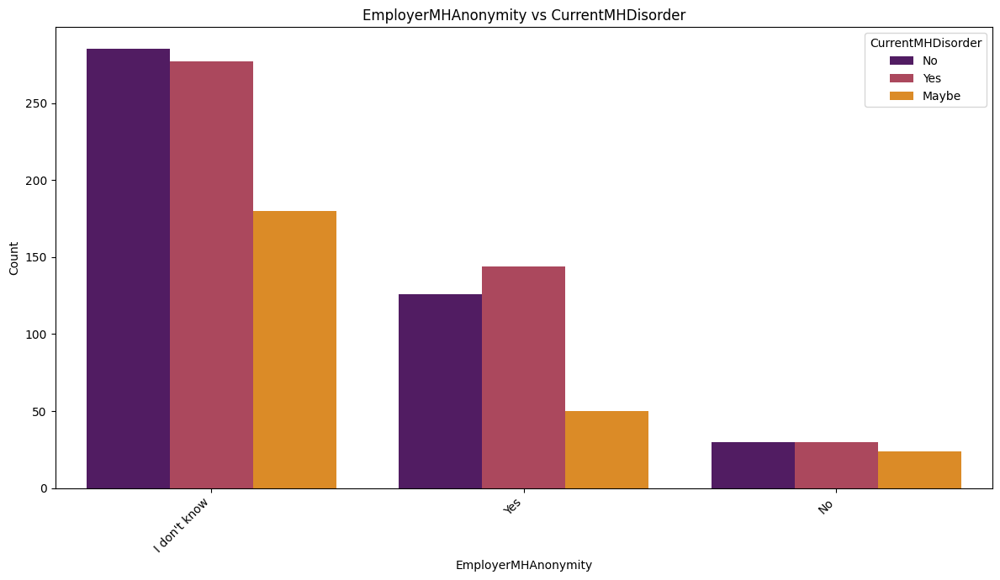

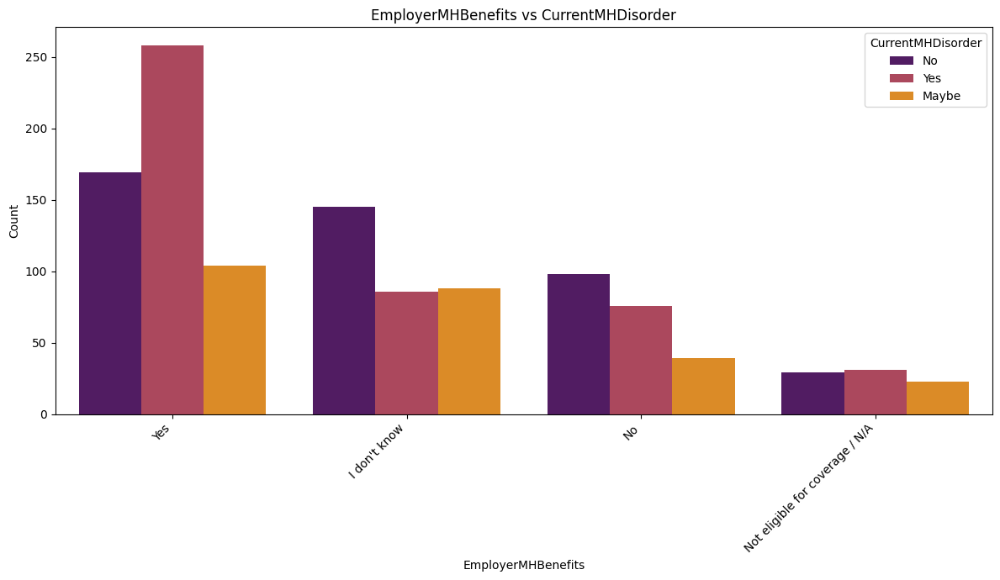

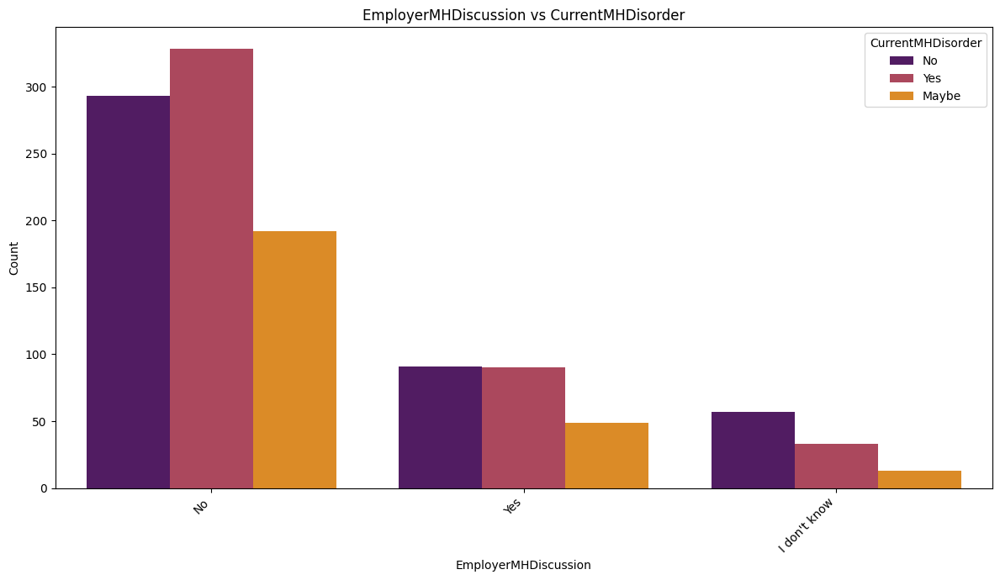

...

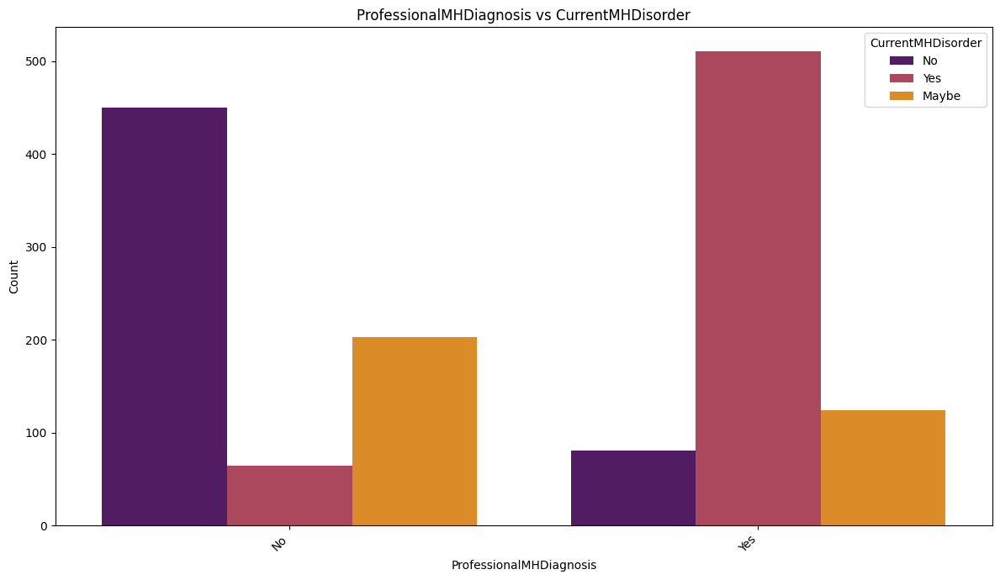

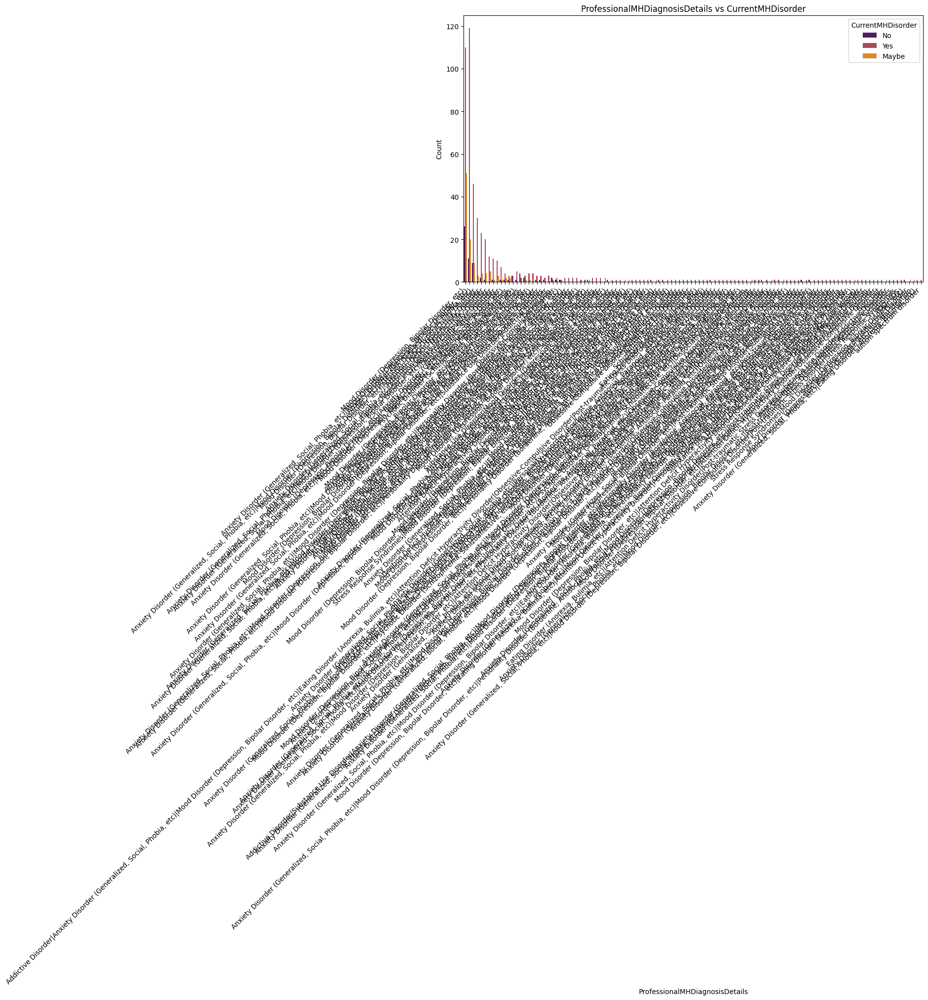

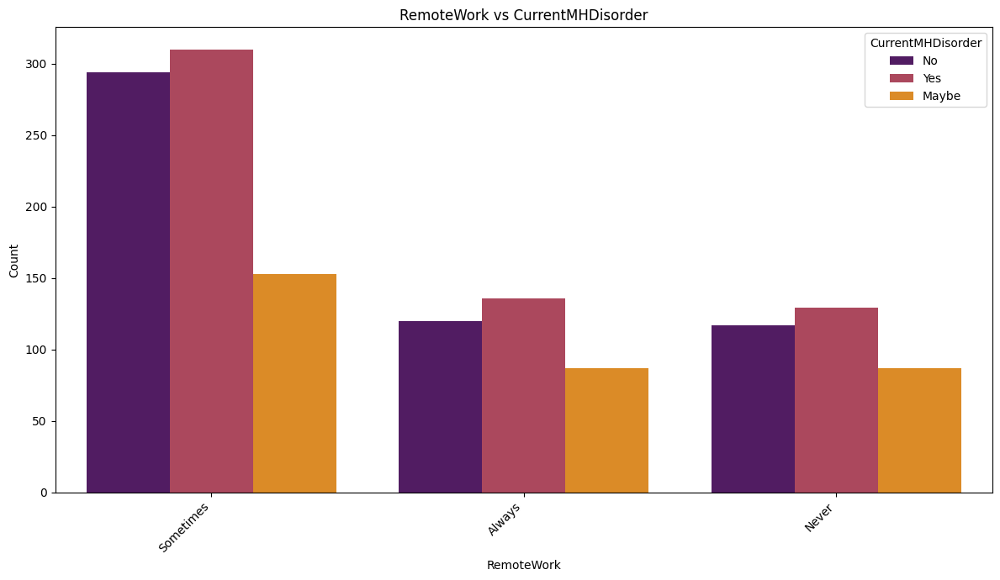

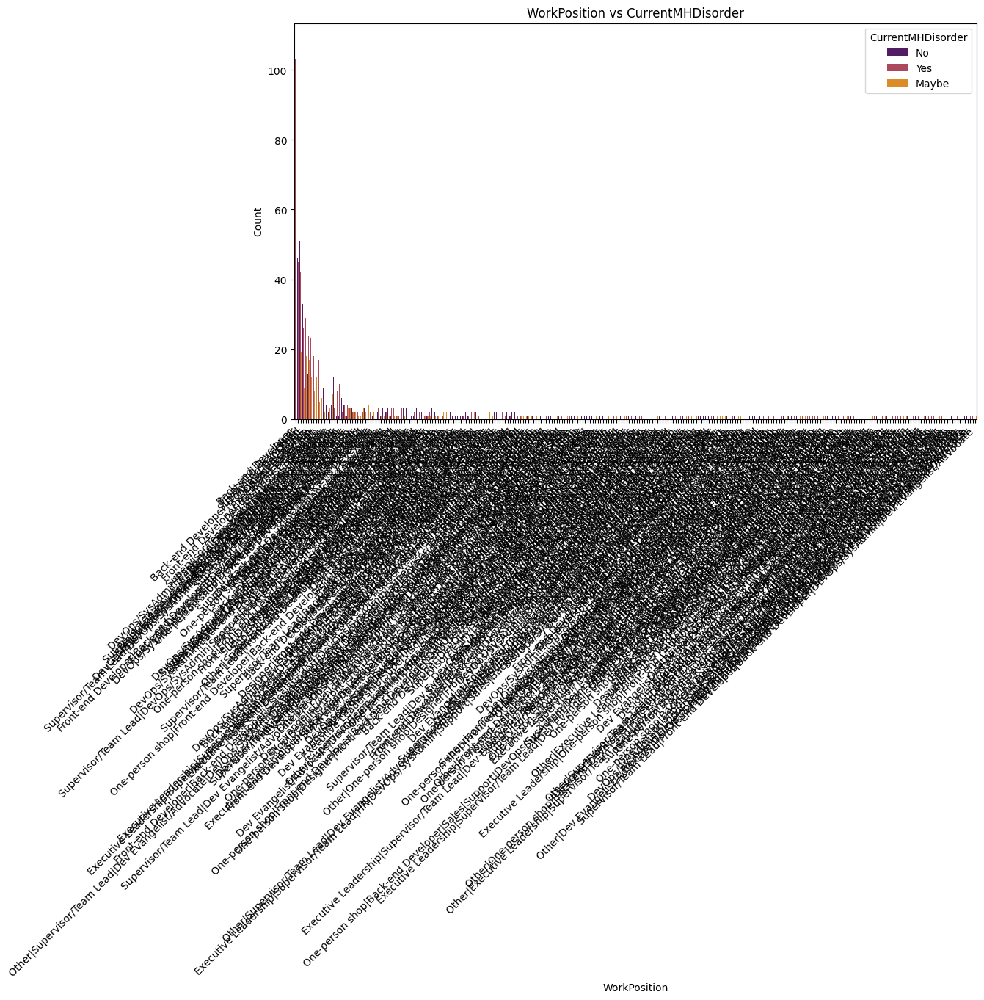

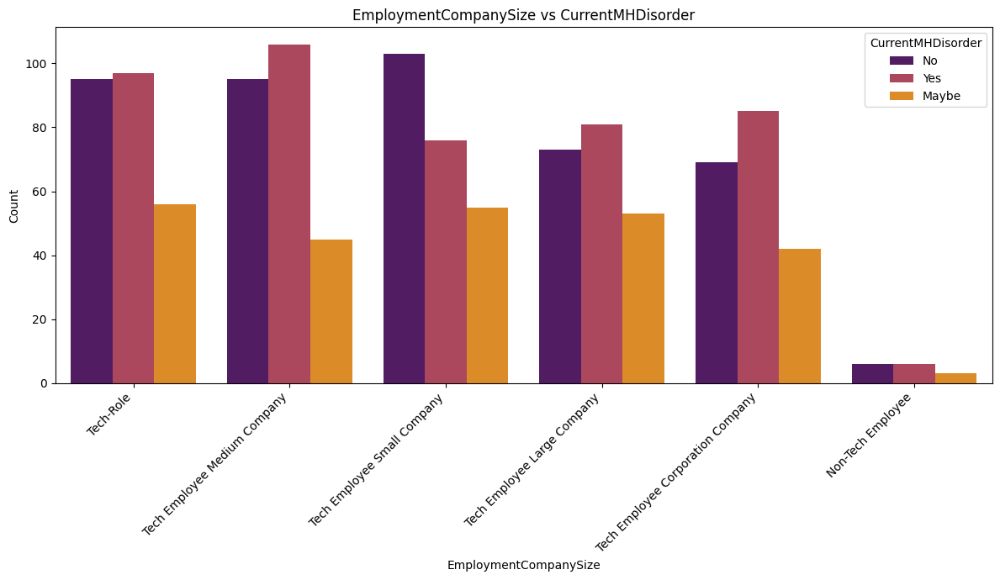

In [25]:
  # Get categorical columns
categorical_vs_target(df_cleaned,  categorical_cols=categorical_cols,target_variable_name="CurrentMHDisorder",)


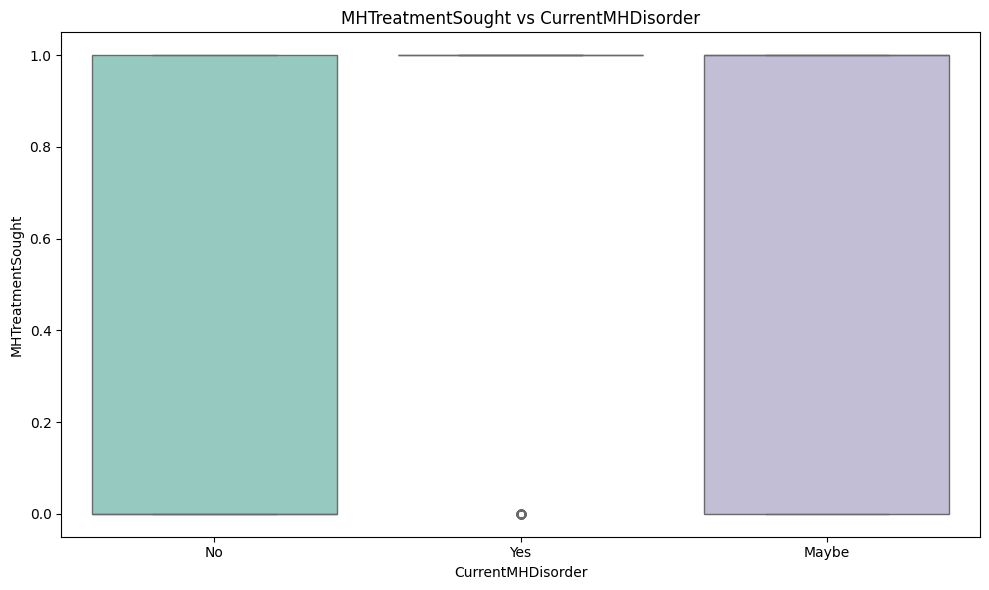

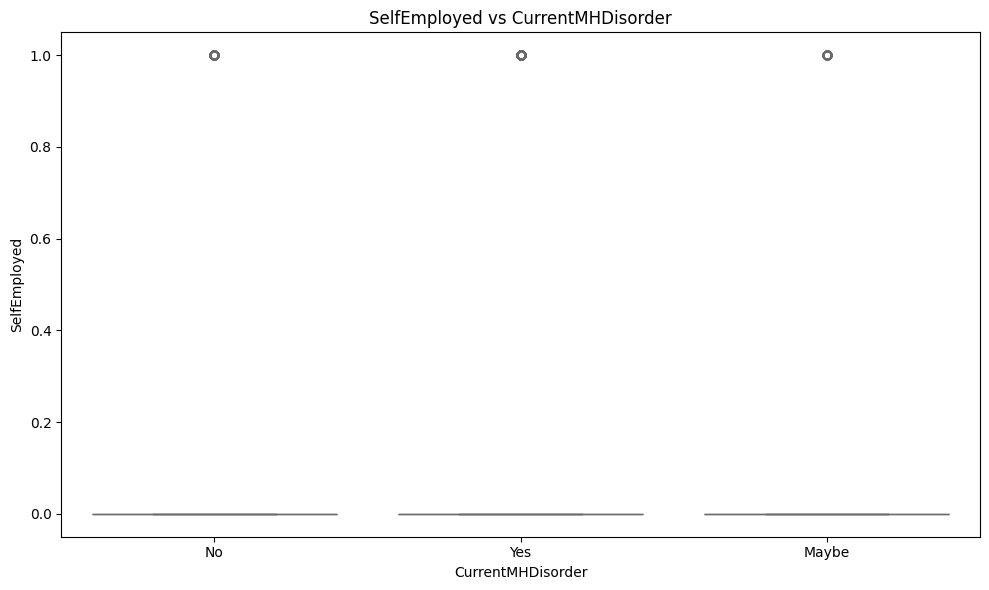

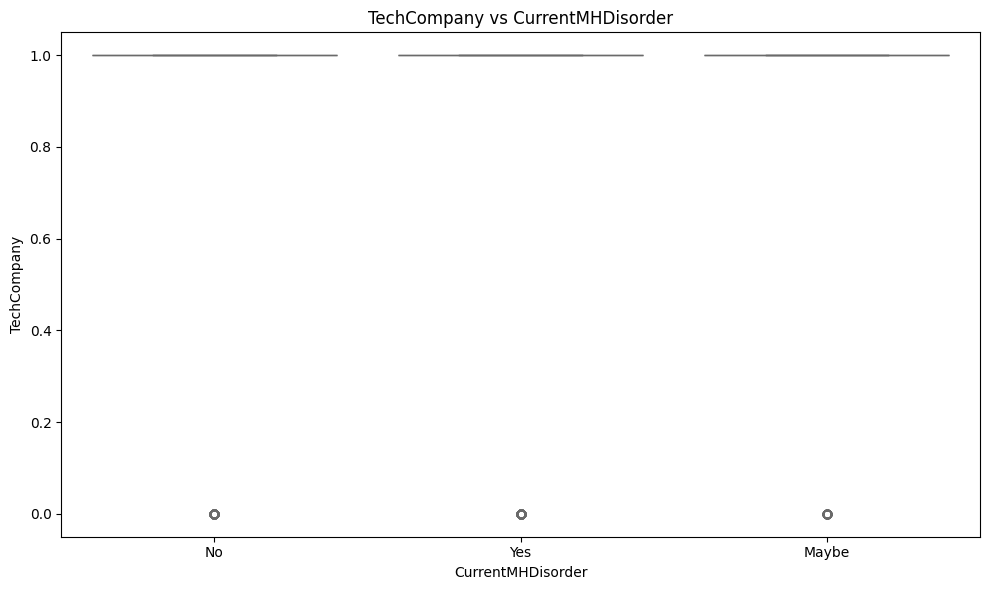

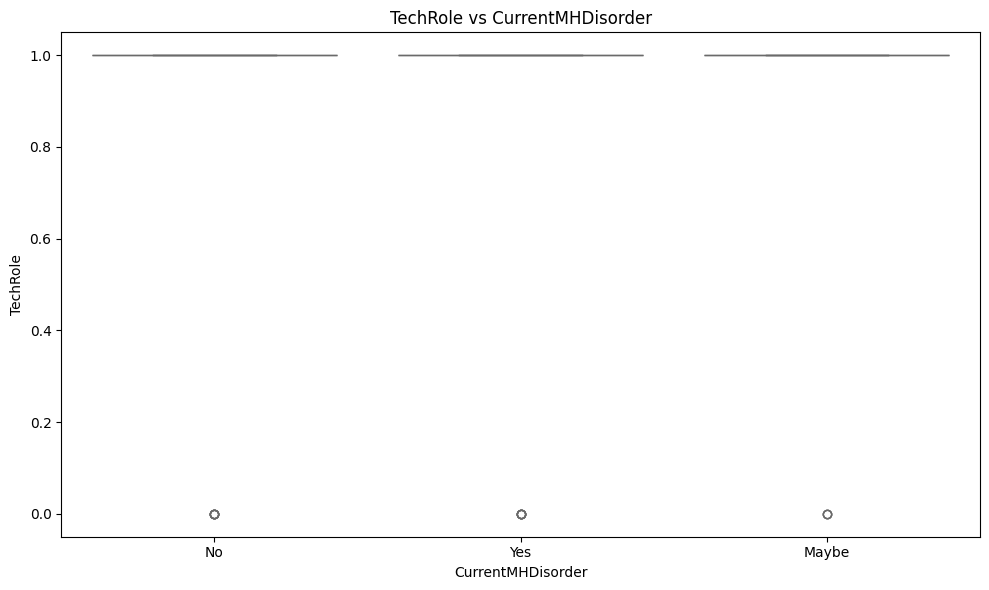

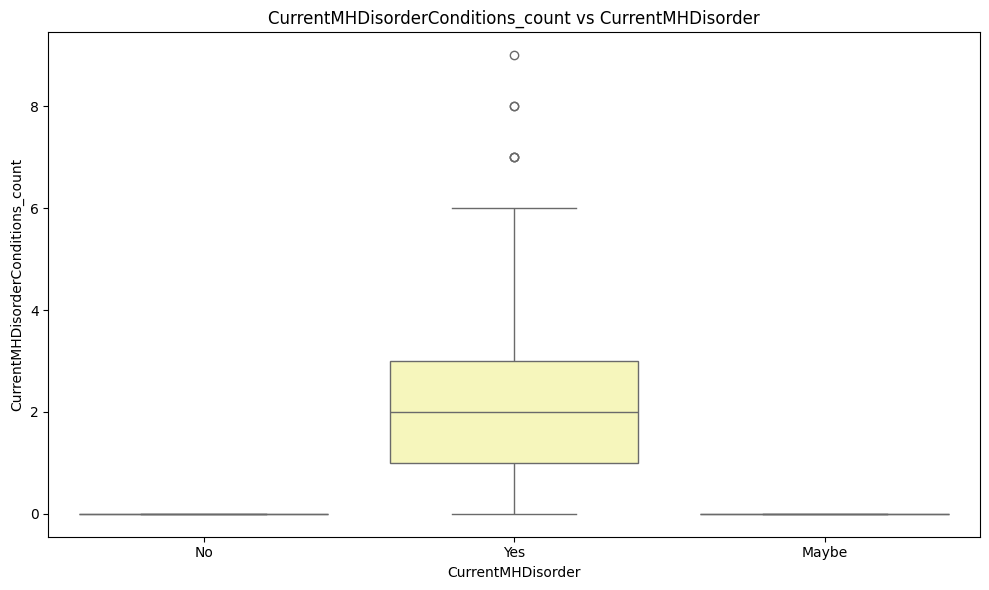

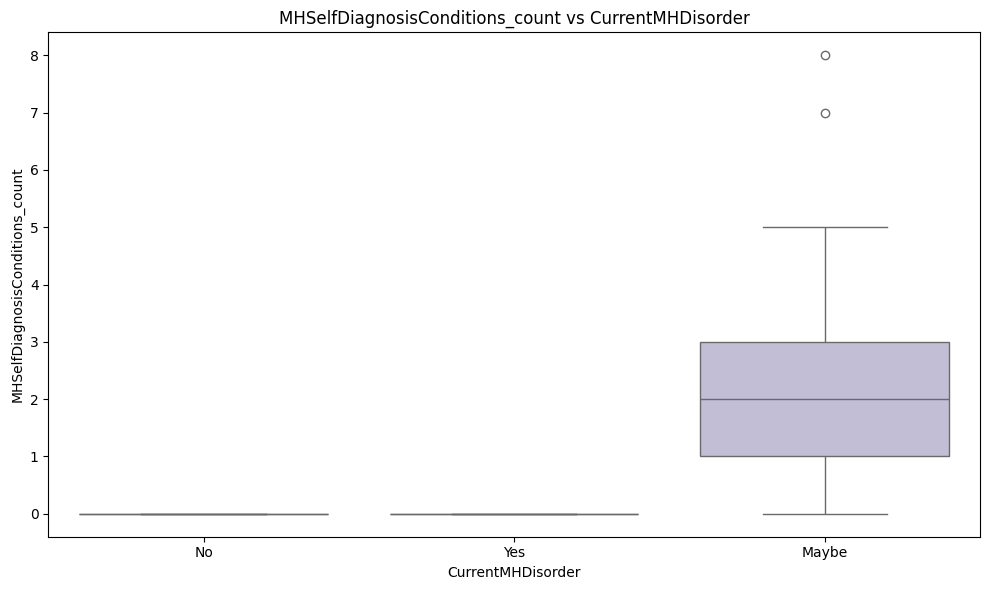

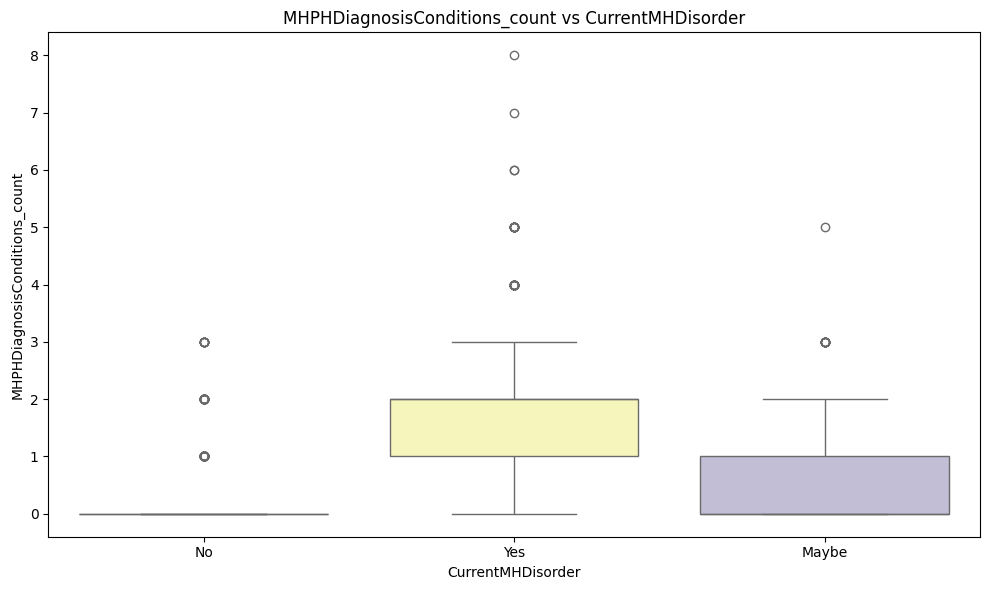

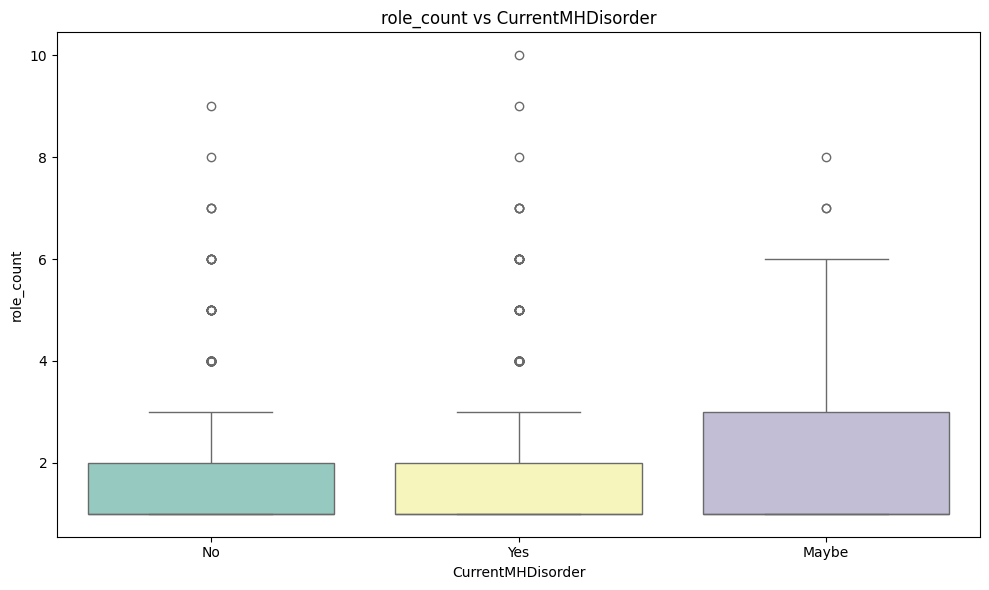

In [26]:
numerical_vs_target(df_cleaned, target_variable_name="CurrentMHDisorder")


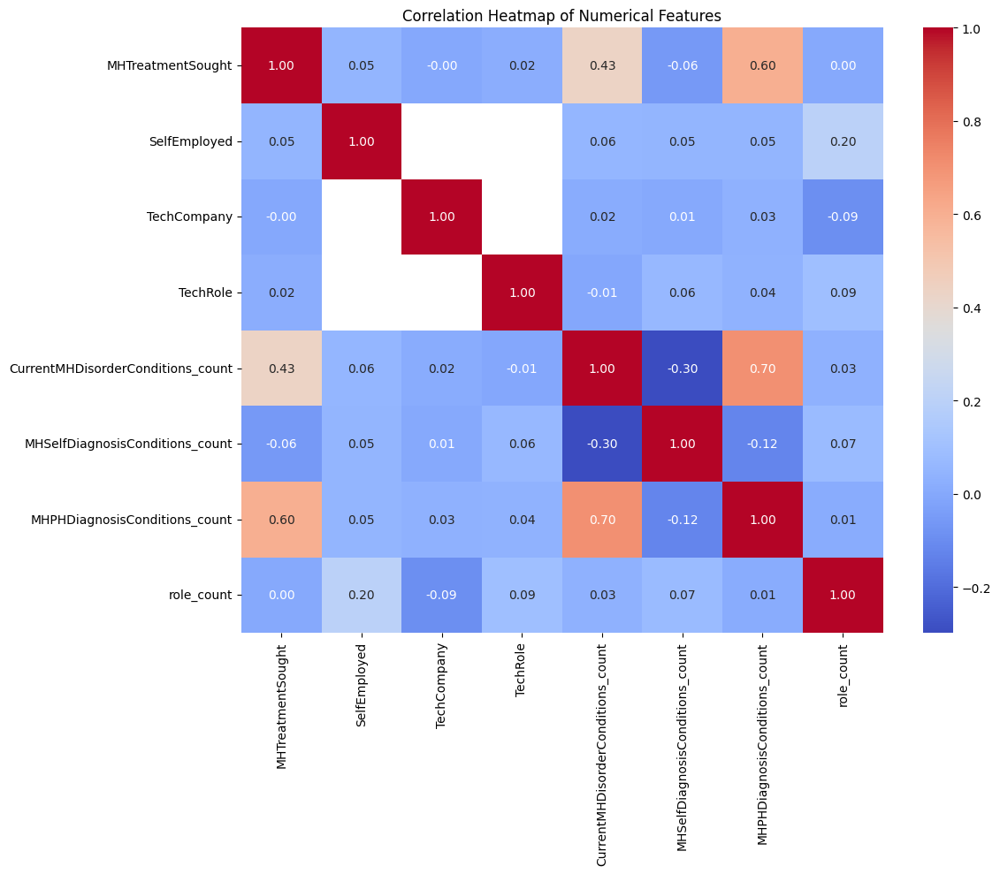

In [27]:
plot_correlation_heatmap(df_cleaned)

In [28]:
len(df_cleaned.columns.to_list())

48

In [29]:
df_cleaned.columns.to_list()

['Age_group',
 'CountryLive',
 'CountryWork',
 'CurrentMHDisorder',
 'EmployerMHAnonymity',
 'EmployerMHBenefits',
 'EmployerMHDiscussion',
 'EmployerMHResources',
 'EmployerMHVsPhysical',
 'FamilyMHHistory',
 'Gender',
 'MHBenefitsAwareness',
 'MHCareerImpact',
 'MHDisclosureClients',
 'MHDisclosureClientsNegative',
 'MHDisclosureCoworkers',
 'MHDisclosureCoworkersNegative',
 'MHDisclosureFamilyFriends',
 'MHDisclosureInfluenced',
 'MHDiscussionCoworkerComfort',
 'MHDiscussionEmployerNegative',
 'MHDiscussionSupervisorComfort',
 'MHInterviewDisclosure',
 'MHLeaveDifficulty',
 'MHNegativeObserved',
 'MHStigmaCoworker',
 'MHTreatmentEffectiveWorkImpact',
 'MHTreatmentIneffectiveWorkImpact',
 'MHTreatmentSought',
 'MHUnsupportiveResponse',
 'PastMHDisorder',
 'PhysicalDiscussionEmployerNegative',
 'PhysicalInterviewDisclosure',
 'PreviousMHNegativeObserved',
 'ProfessionalMHDiagnosis',
 'ProfessionalMHDiagnosisDetails',
 'RemoteWork',
 'SelfEmployed',
 'StateLive',
 'StateWork',
 'TechCo

In [87]:
# Dropping Unnecessary Columns
drop_cols = [
    # 'ProfessionalMHDiagnosisDetails',
    #             'RemoteWork',
    #             'StateLive',
    #             'StateWork',
    #             'CountryLive',
    #             'CountryWork','MHBenefitsAwareness',
    #             'SelfEmployed', 'TechCompany','role_count', 'TechRole', 'WorkPosition', 
                
                
                
                #Engineered features:

             'CurrentMHDisorderConditions_count',
             'MHSelfDiagnosisConditions_count',
             'MHPHDiagnosisConditions_count',
           
    #Low Ranked Features in SHAP

     'MHUnsupportiveResponse',
     'EmployerMHDiscussion',
    'PhysicalDiscussionEmployerNegative',
     'PhysicalInterviewDisclosure',
     'PreviousMHNegativeObserved',
     'ProfessionalMHDiagnosis',
     'EmployerMHVsPhysical',
     'MHCareerImpact',
     'MHDisclosureClients',
     'MHDisclosureClientsNegative',
     'MHDisclosureCoworkers',
     'MHDisclosureCoworkersNegative',
     'MHDisclosureFamilyFriends',
     'MHDisclosureInfluenced',
     'MHDiscussionCoworkerComfort',
     'MHDiscussionEmployerNegative',
     'MHDiscussionSupervisorComfort',
    
 ]
df_cleaned = df_cleaned.drop(columns=drop_cols)
print("Unnecessary columns dropped.")

Unnecessary columns dropped.


In [88]:
len(df_cleaned.columns.to_list())

17

In [89]:
print("\n--- Exploratory Data Analysis Completed ---")


--- Exploratory Data Analysis Completed ---


In [90]:
# Target Variable Encoding
# --- Label Encoding ---
le = LabelEncoder()

target_variable = df_cleaned["CurrentMHDisorder"]
print(
    f"Target variable '{target_variable.name}' unique values: {target_variable.unique()}")
print(f"Data type of '{target_variable.name}': {target_variable.dtype}")

Target variable 'CurrentMHDisorder' unique values: ['No' 'Yes' 'Maybe']
Data type of 'CurrentMHDisorder': object


In [91]:
target_encoded = le.fit_transform(target_variable)
target_encoded_series = pd.Series(target_encoded, name='target_encoded')
print("Target variable encoded.")
print("Label Encoding Mapping:")
for original_label, encoded_value in zip(le.classes_, le.transform(le.classes_)):
    print(f"{original_label}: {encoded_value}")
    

Target variable encoded.
Label Encoding Mapping:
Maybe: 0
No: 1
Yes: 2


In [92]:
len(df_cleaned.columns.to_list())

17

In [93]:
# Encoding Categorical Features
categorical_df = df_cleaned.select_dtypes(exclude='number').drop(
    columns='CurrentMHDisorder',)
numerical_df = df_cleaned.select_dtypes(exclude=['object', 'category'])


In [95]:
encoded_categorical = encode_categorical_columns(categorical_df=categorical_df)
print("Categorical features encoded.")

Categorical features encoded.


In [96]:
# --- Data Concatination  ---
print("\n--- Data Splitting and Scaling ---")
X = pd.concat((encoded_categorical, numerical_df), axis=1)
y = target_encoded  


--- Data Splitting and Scaling ---


In [71]:
# # --- Data Scaling   ---
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

In [98]:
# --- Data Splitting  ---
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.25, random_state=42
)
X_dev,  X_test, y_dev, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42
)

print(f"Train size: {len(X_train)}")
print(f"Dev size: {len(X_dev)}")
print(f"Test size: {len(X_test)}")

Train size: 1074
Dev size: 179
Test size: 180


In [99]:
tuned_models, non_tuned_models=get_models()

In [100]:
# Dictionary to store baseline results
baseline_results = defaultdict(dict)

print("Training baseline (non-tuned) models...")

for name, model_info in non_tuned_models.items():
    model = model_info['model']
    model.fit(X_train, y_train)

    y_pred_dev = model.predict(X_dev)
    y_pred_test = model.predict(X_test)

    baseline_results[name]["model"] = model
    baseline_results[name]["best_params"] = "Default (No tuning)"
    baseline_results[name]["accuracy_dev"] = accuracy_score(y_dev, y_pred_dev)
    baseline_results[name]["report_dev"] = classification_report(y_dev, y_pred_dev)
    baseline_results[name]["accuracy_test"] = accuracy_score(y_test, y_pred_test)
    baseline_results[name]["report_test"] = classification_report(y_test, y_pred_test)


Training baseline (non-tuned) models...


In [101]:
# Dictionary to store tuned results
tuned_results = defaultdict(dict)

print("Training tuned models with RandomizedSearchCV...")

n_iter = 20

for name, model_info in tuned_models.items():
    model = model_info['model']
    param_grid = model_info['params']

    search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=n_iter,
        scoring='accuracy',
        cv=3,
        verbose=1,
        n_jobs=-1,
        random_state=42
    )
    search.fit(X_train, y_train)
    
    best_model = search.best_estimator_

    y_pred_dev_tuned = best_model.predict(X_dev)
    y_pred_test_tuned = best_model.predict(X_test)

    tuned_results[name]["model"] = best_model
    tuned_results[name]["best_params"] = search.best_params_
    tuned_results[name]["accuracy_dev"] = accuracy_score(y_dev, y_pred_dev_tuned)
    tuned_results[name]["report_dev"] = classification_report(y_dev, y_pred_dev_tuned)
    tuned_results[name]["accuracy_test"] = accuracy_score(y_test, y_pred_test_tuned)
    tuned_results[name]["report_test"] = classification_report(y_test, y_pred_test_tuned)


Training tuned models with RandomizedSearchCV...
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 9 candidates, totalling 27 fits
Fitting 3 folds for each of 18 candidates, totalling 54 fits


In [102]:
# Merge baseline and tuned results
all_results = {**baseline_results, **tuned_results}


In [103]:
print("No Feature Engineering Baseline Model Comparison:")

for name, info in baseline_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])

No Feature Engineering Baseline Model Comparison:

Logistic Regression (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.7151
Test Accuracy: 0.7833
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.65      0.49      0.56        35
           1       0.78      0.84      0.81        63
           2       0.83      0.87      0.85        82

    accuracy                           0.78       180
   macro avg       0.75      0.73      0.74       180
weighted avg       0.78      0.78      0.78       180


Random Forest Classifier (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.7207
Test Accuracy: 0.8000
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.64      0.60      0.62        35
           1       0.87      0.84      0.85        63
           2       0.81      0.85      0.83        82

    accuracy                           0.80       180
   macro

In [104]:
print("No Feature Engineering Fine TUned Model Comparison:")

for name, info in tuned_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])


No Feature Engineering Fine TUned Model Comparison:

Logistic Regression (Tuned)
Best Params: {'penalty': 'l2'}
Dev Accuracy: 0.7151
Test Accuracy: 0.7833
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.65      0.49      0.56        35
           1       0.78      0.84      0.81        63
           2       0.83      0.87      0.85        82

    accuracy                           0.78       180
   macro avg       0.75      0.73      0.74       180
weighted avg       0.78      0.78      0.78       180


Random Forest (Tuned)
Best Params: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Dev Accuracy: 0.7207
Test Accuracy: 0.7944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.62      0.57      0.60        35
           1       0.86      0.81      0.84        63
           2       0.81      0.88      0.8

In [105]:
print(" No Feature Engineering Final Model Comparison:")

for name, info in all_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])


 No Feature Engineering Final Model Comparison:

Logistic Regression (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.7151
Test Accuracy: 0.7833
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.65      0.49      0.56        35
           1       0.78      0.84      0.81        63
           2       0.83      0.87      0.85        82

    accuracy                           0.78       180
   macro avg       0.75      0.73      0.74       180
weighted avg       0.78      0.78      0.78       180


Random Forest Classifier (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.7207
Test Accuracy: 0.8000
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.64      0.60      0.62        35
           1       0.87      0.84      0.85        63
           2       0.81      0.85      0.83        82

    accuracy                           0.80       180
   macro a

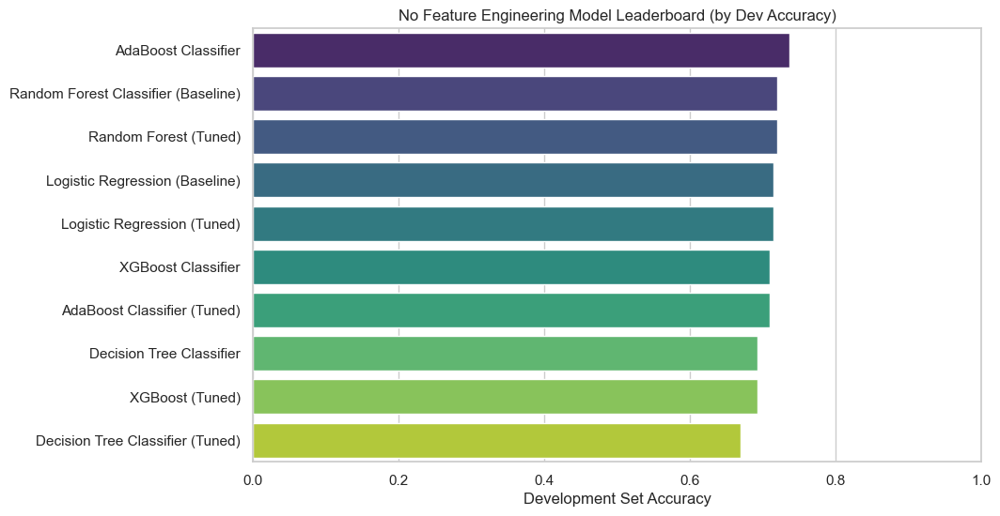

In [106]:
leaderboard = [{
    'Model': name,
    'Dev Accuracy': info['accuracy_dev'],
    'Test Accuracy': info['accuracy_test']
} for name, info in all_results.items()]

leaderboard = sorted(leaderboard, key=lambda x: x['Dev Accuracy'], reverse=True)

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(
    x=[entry['Dev Accuracy'] for entry in leaderboard],
    y=[entry['Model'] for entry in leaderboard],
    palette="viridis"
)
plt.xlabel("Development Set Accuracy")
plt.title("No Feature Engineering Model Leaderboard (by Dev Accuracy)")
plt.xlim(0, 1)
plt.show()


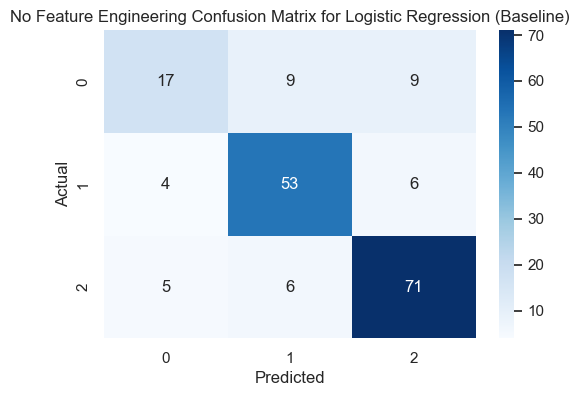

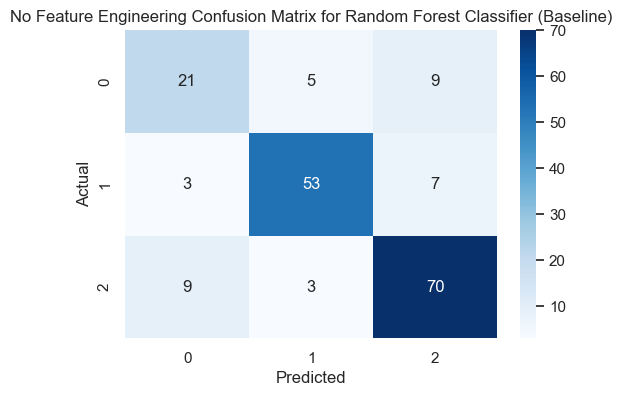

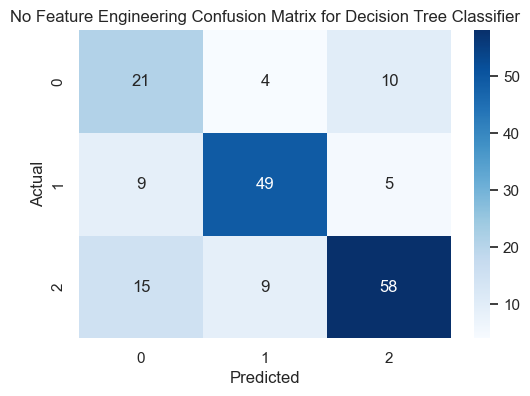

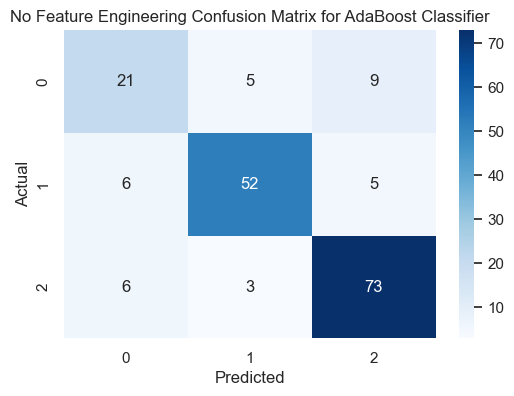

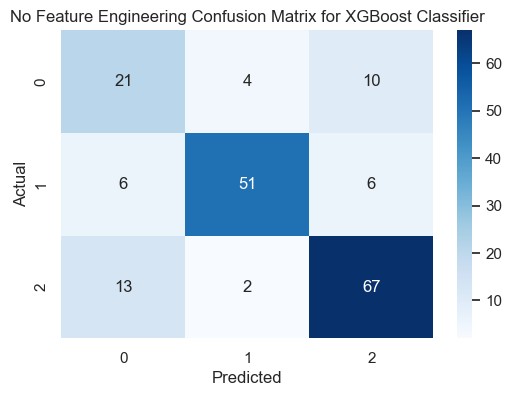

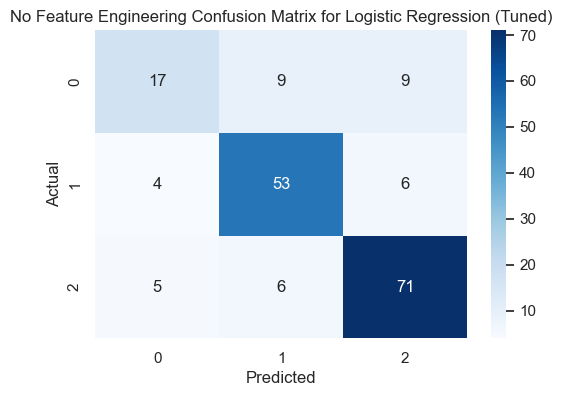

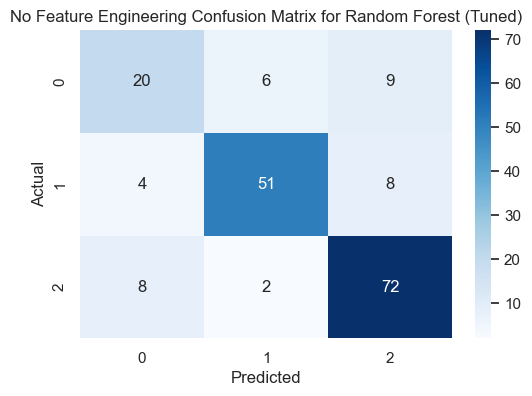

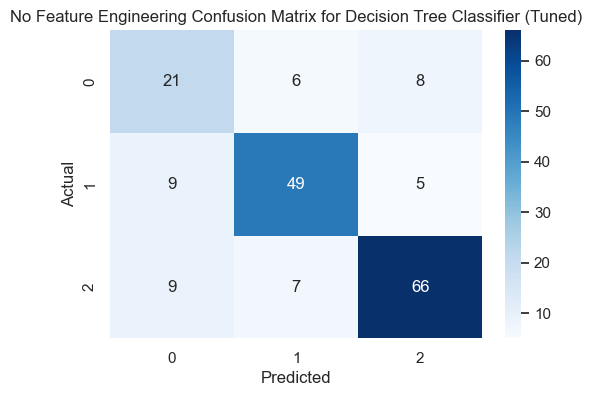

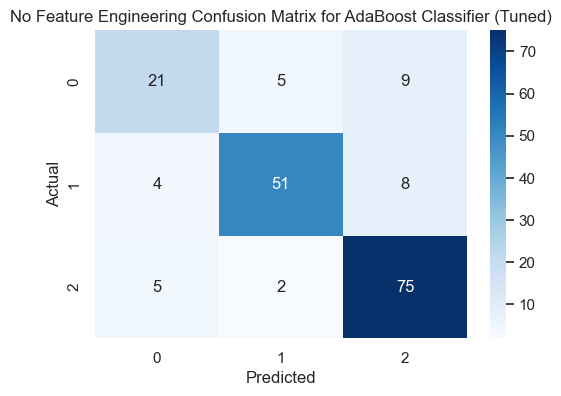

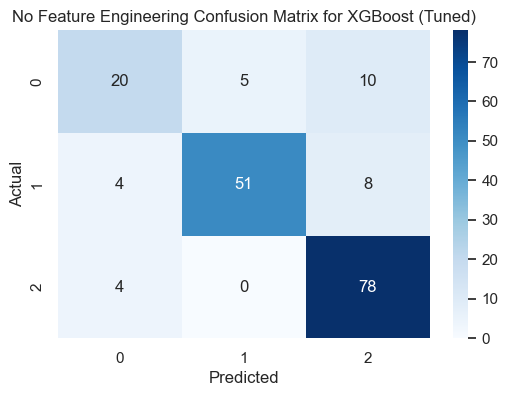

In [107]:
for name, info in all_results.items():
    model = info['model']
    y_pred_test = model.predict(X_test)

    cm = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"No Feature Engineering Confusion Matrix for {name}")
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()


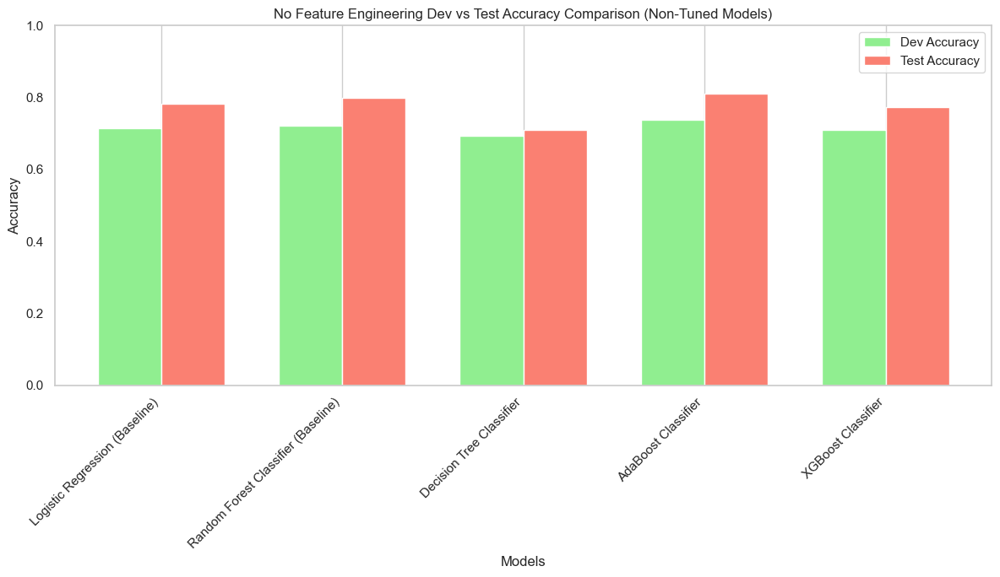

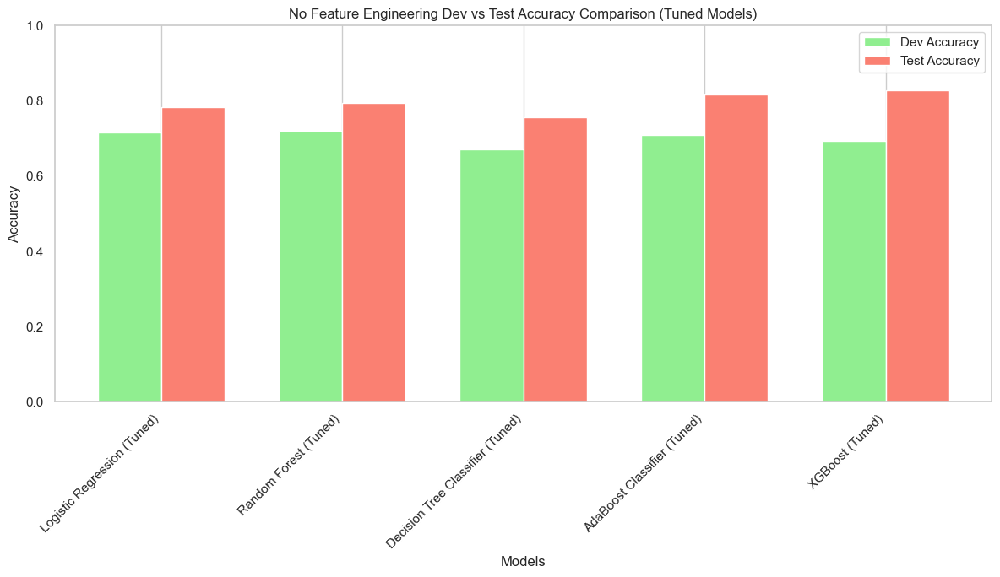

In [108]:
# Separate tuned and non-tuned names
tuned_names = list(tuned_results.keys())
non_tuned_names = list(baseline_results.keys())

def plot_group(names, title_suffix):
    models = []
    dev_acc = []
    test_acc = []

    for name in names:
        info = all_results[name]
        models.append(name)
        dev_acc.append(info['accuracy_dev'])
        test_acc.append(info['accuracy_test'])

    x = np.arange(len(models))
    width = 0.35

    plt.figure(figsize=(12, 7))
    plt.bar(x - width/2, dev_acc, width=width, label='Dev Accuracy', color='lightgreen')
    plt.bar(x + width/2, test_acc, width=width, label='Test Accuracy', color='salmon')

    plt.xlabel("Models")
    plt.ylabel("Accuracy")
    plt.title(f"No Feature Engineering Dev vs Test Accuracy Comparison ({title_suffix})")
    plt.xticks(x, models, rotation=45, ha='right')
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

# Plot for non-tuned
plot_group(non_tuned_names, "Non-Tuned Models")

# Plot for tuned
plot_group(tuned_names, "Tuned Models")


In [ ]:
def shap_explain_model(results, X_sample):
    """Explain the top model using SHAP values."""
    print("\n Running SHAP Explainability...")

    # Pick the best model by dev accuracy
    best_model_name = max(results, key=lambda x: results[x]['accuracy_dev'])
    best_model = results[best_model_name]['model']
    
    print(f"Explaining {best_model_name}")

    try:
        explainer = shap.TreeExplainer(best_model)
    except Exception as e:
        # For tree-based models (like RandomForest)
        explainer = shap.Explainer(best_model, X_sample)
        # print error message
        print(f"Error using SHAP Explainer: {e}")

    shap_values = explainer(X_sample)

    shap.summary_plot(shap_values, X_sample, feature_names=X_sample.columns.to_list(),plot_type="bar",)




 Running SHAP Explainability...
Explaining Random Forest (Tuned)


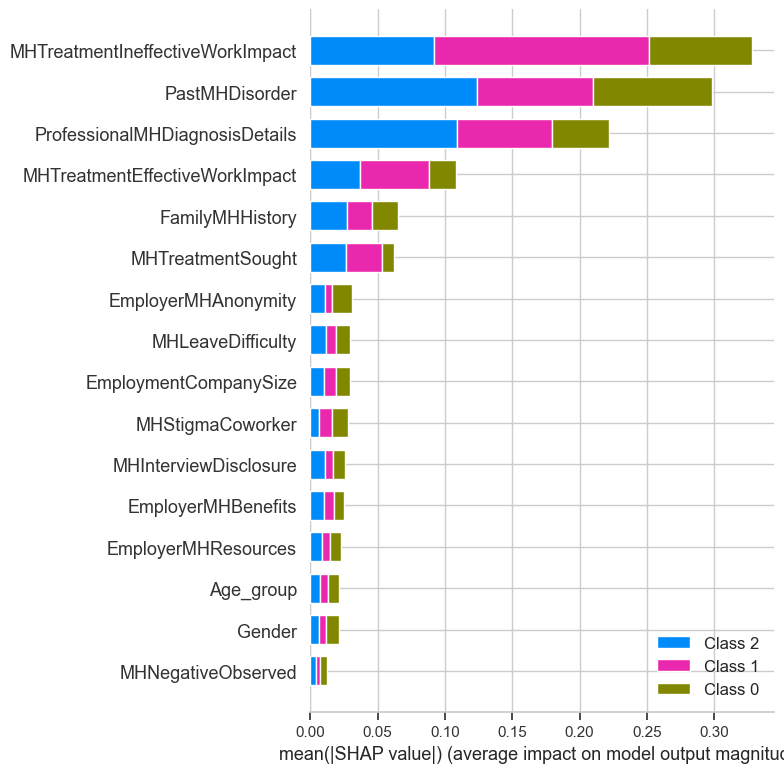

In [118]:
# 5. SHAP Explain Top Model (X_sample can be a small subset of your dev or test set)
shap_explain_model(tuned_results, X[:100]) 
## AdaBoost Classifier not working with SHAP explainer, so using RandomForestClassifier instead

### Feature Engineered Results

In [77]:
print("Final Model Comparison:")

for name, info in baseline_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])


Final Model Comparison:

Logistic Regression (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy                           0.99       180
   macro avg       0.99      0.99      0.99       180
weighted avg       0.99      0.99      0.99       180


Random Forest Classifier (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy                           0.99       180
   macro avg       0.99      0.99 

In [ ]:
print("Final Model Comparison:")

for name, info in tuned_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])


Final Model Comparison:

Logistic Regression (Tuned)
Best Params: {'penalty': 'l1'}
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy                           0.99       180
   macro avg       0.99      0.99      0.99       180
weighted avg       0.99      0.99      0.99       180


Random Forest (Tuned)
Best Params: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20}
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy     

In [79]:
print("Final Model Comparison:")

for name, info in all_results.items():
    print(f"\n{name}")
    print(f"Best Params: {info['best_params']}")
    print(f"Dev Accuracy: {info['accuracy_dev']:.4f}")
    print(f"Test Accuracy: {info['accuracy_test']:.4f}")
    print("Classification Report (Test Set):")
    print(info['report_test'])


Final Model Comparison:

Logistic Regression (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy                           0.99       180
   macro avg       0.99      0.99      0.99       180
weighted avg       0.99      0.99      0.99       180


Random Forest Classifier (Baseline)
Best Params: Default (No tuning)
Dev Accuracy: 0.9888
Test Accuracy: 0.9944
Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        35
           1       0.98      1.00      0.99        63
           2       1.00      1.00      1.00        82

    accuracy                           0.99       180
   macro avg       0.99      0.99 

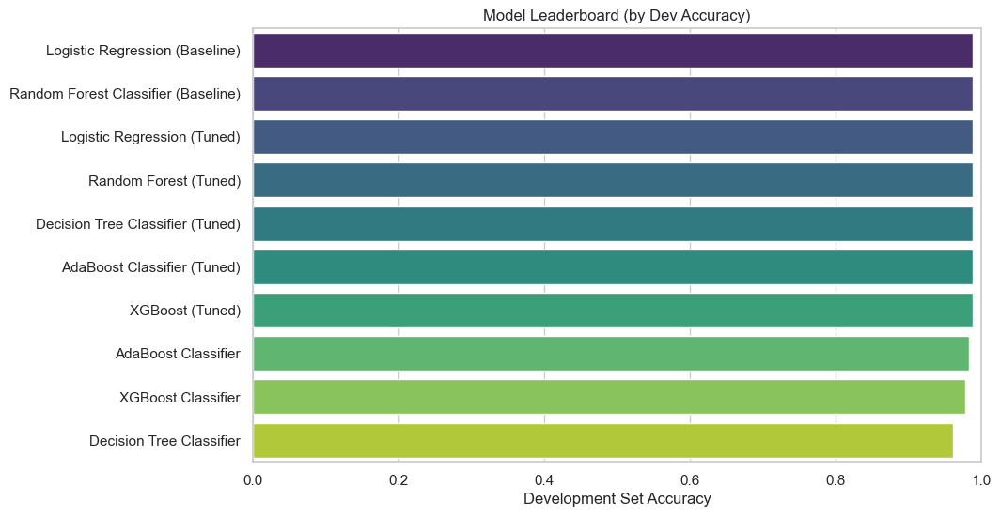

In [80]:
leaderboard = [{
    'Model': name,
    'Dev Accuracy': info['accuracy_dev'],
    'Test Accuracy': info['accuracy_test']
} for name, info in all_results.items()]

leaderboard = sorted(leaderboard, key=lambda x: x['Dev Accuracy'], reverse=True)

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(
    x=[entry['Dev Accuracy'] for entry in leaderboard],
    y=[entry['Model'] for entry in leaderboard],
    palette="viridis"
)
plt.xlabel("Development Set Accuracy")
plt.title("Model Leaderboard (by Dev Accuracy)")
plt.xlim(0, 1)
plt.show()


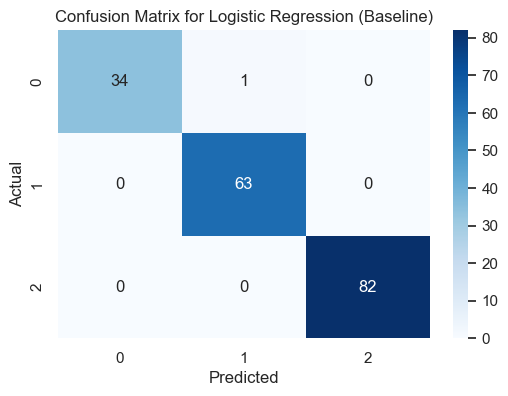

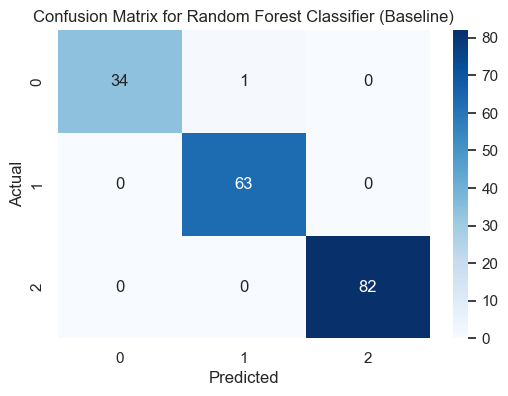

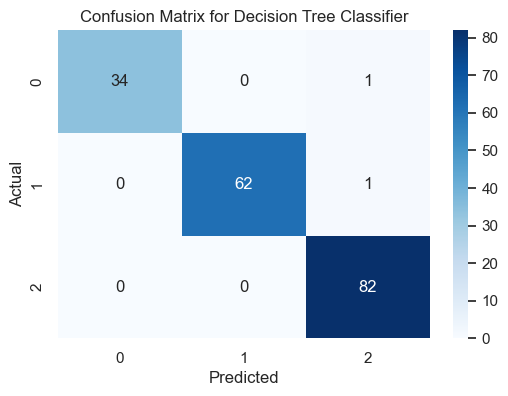

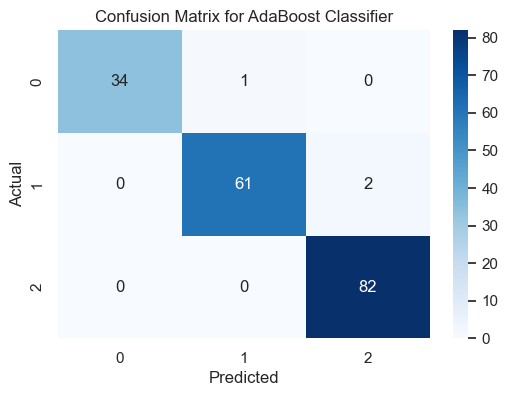

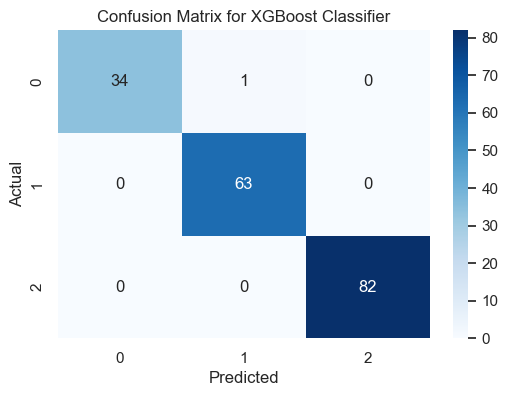

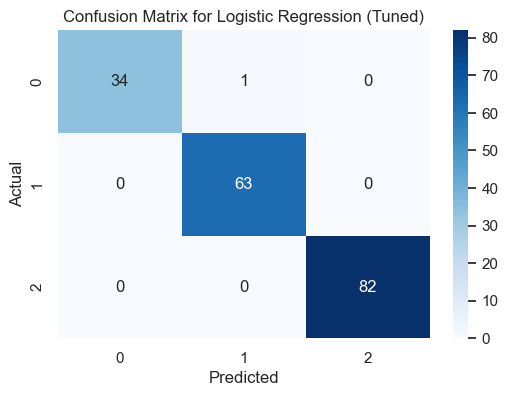

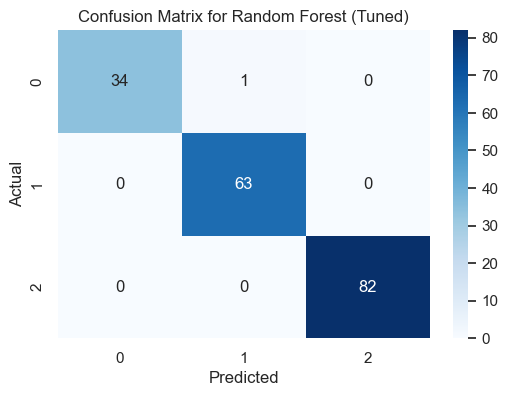

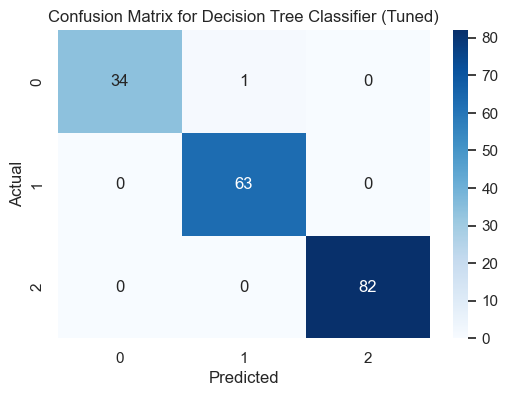

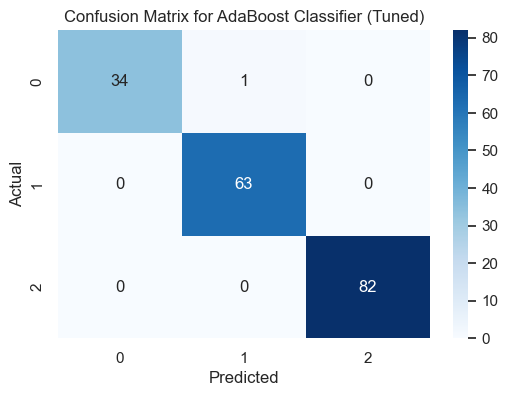

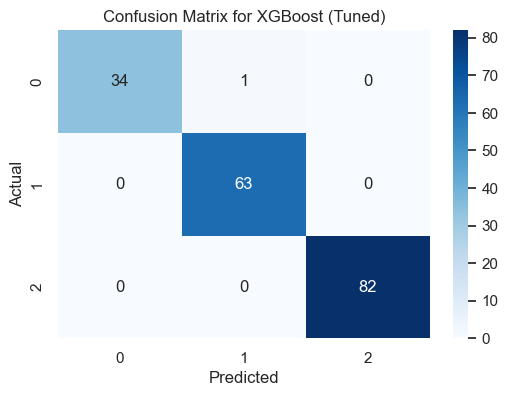

In [81]:
for name, info in all_results.items():
    model = info['model']
    y_pred_test = model.predict(X_test)

    cm = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix for {name}")
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()


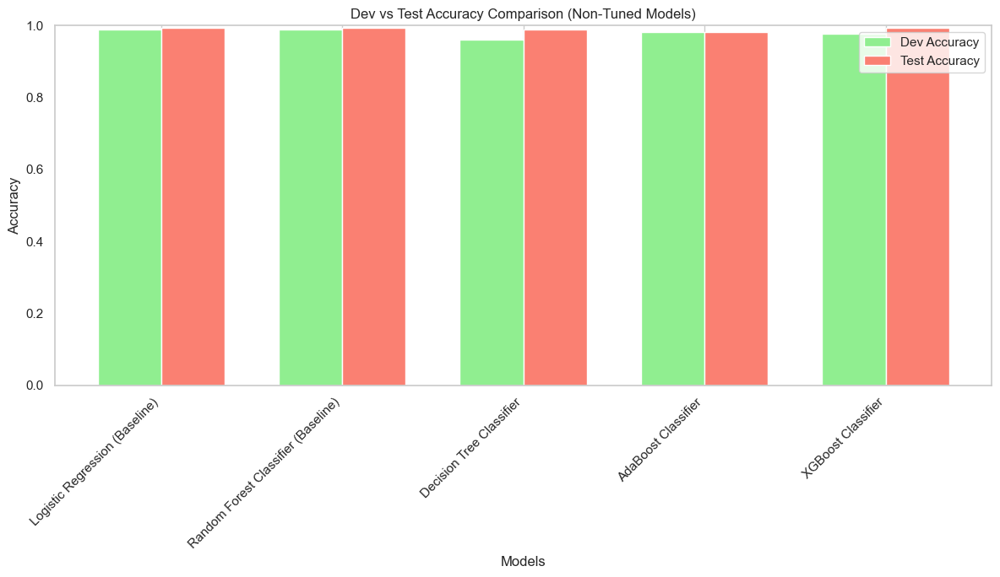

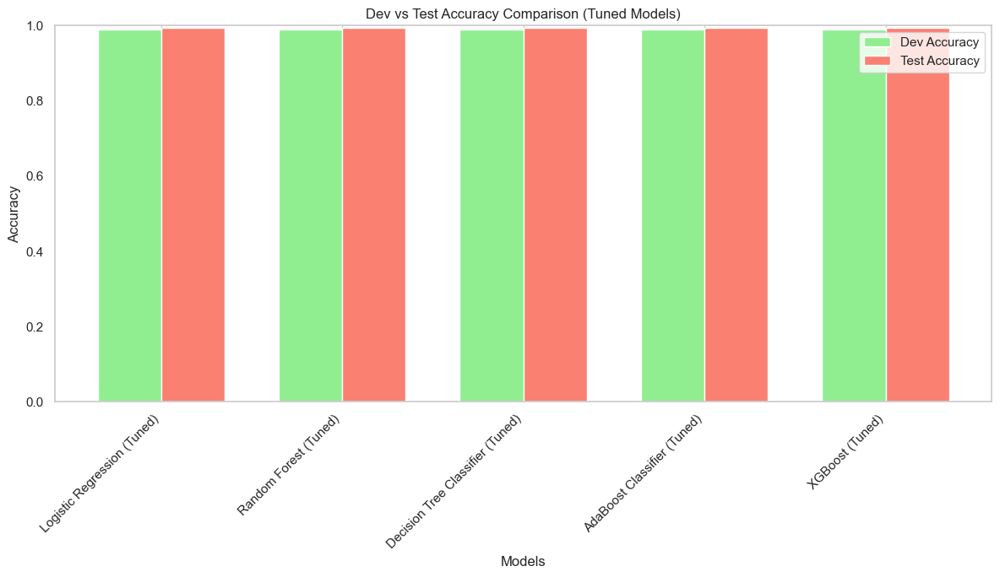

In [82]:
# Separate tuned and non-tuned names
tuned_names = list(tuned_results.keys())
non_tuned_names = list(baseline_results.keys())

def plot_group(names, title_suffix):
    models = []
    dev_acc = []
    test_acc = []

    for name in names:
        info = all_results[name]
        models.append(name)
        dev_acc.append(info['accuracy_dev'])
        test_acc.append(info['accuracy_test'])

    x = np.arange(len(models))
    width = 0.35

    plt.figure(figsize=(12, 7))
    plt.bar(x - width/2, dev_acc, width=width, label='Dev Accuracy', color='lightgreen')
    plt.bar(x + width/2, test_acc, width=width, label='Test Accuracy', color='salmon')

    plt.xlabel("Models")
    plt.ylabel("Accuracy")
    plt.title(f"Dev vs Test Accuracy Comparison ({title_suffix})")
    plt.xticks(x, models, rotation=45, ha='right')
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

# Plot for non-tuned
plot_group(non_tuned_names, "Non-Tuned Models")

# Plot for tuned
plot_group(tuned_names, "Tuned Models")



 Running SHAP Explainability...
Explaining Logistic Regression (Baseline)


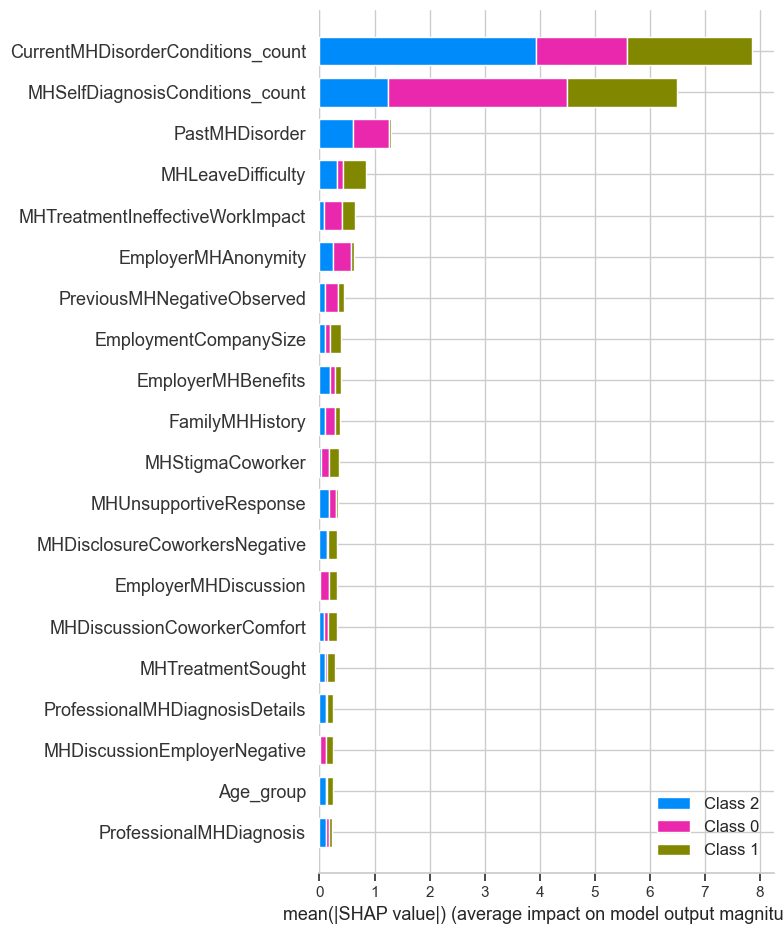

In [84]:

# 5. SHAP Explain Top Model (X_sample can be a small subset of your dev or test set)
shap_explain_model(all_results, X[:100]) 

Running SHAP Explainability...
Explaining model: Logistic Regression (Baseline)


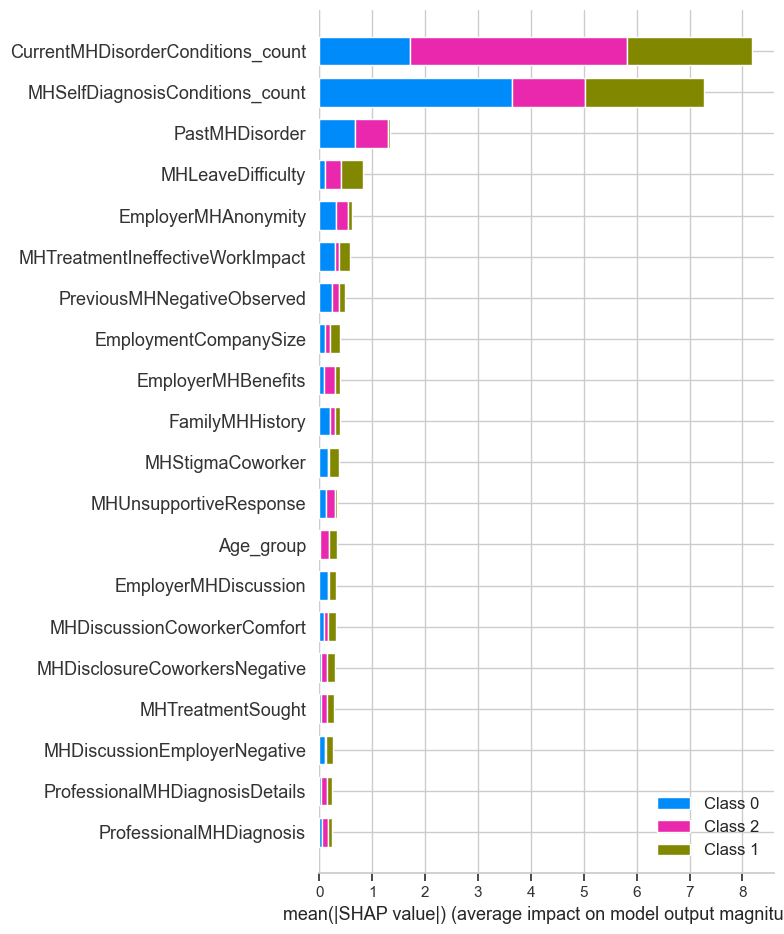

In [85]:
print("Running SHAP Explainability...")

# Find best model based on Dev Accuracy
best_model_name = max(all_results, key=lambda name: all_results[name]['accuracy_dev'])
best_model = all_results[best_model_name]['model']

print(f"Explaining model: {best_model_name}")

# Try generic or TreeExplainer
# Ensure X_test contains only numerical data
X_test_numeric = X_test.select_dtypes(include=[np.number])

try:
    explainer = shap.Explainer(best_model, X_test_numeric)
except Exception:
    explainer = shap.TreeExplainer(best_model)

shap_values = explainer(X_test)

shap.summary_plot(
    shap_values,
    X_test,
    feature_names=X.columns.to_list(),
    plot_type="bar"
)
